In [39]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from math import sqrt
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

import shapefile
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon, Circle, Rectangle
from mpl_toolkits.axes_grid1 import make_axes_locatable
import os
os.environ["PROJ_LIB"] = 'D:/workingProgramProfile/Anaconda/Library/share/'
from mpl_toolkits.basemap import Basemap
from shapely.geometry import Point, Polygon as shapePolygon
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.lines as lines
from scipy.io import loadmat
from osgeo import gdal,osr

In [2]:
# statistical boxplots of observated SOC, N2O, N leaching, and yield
model_inputs_dir = 'D:/carbon credit/metaforest/county_project/inputs/'
model_outputs_dir = 'D:/carbon credit/metaforest/county_project/model_2405_lt/'
county_outputs_dir = 'D:/carbon credit/plot/county_map/cost_benefit/2024/05_lt/'
plot_dir = 'D:/carbon credit/plot/county_map/2024/05_lt/'

data_soc = pd.read_csv(model_inputs_dir + 'SOC_model_inputs.csv')
data_n2o = pd.read_csv(model_inputs_dir + 'N2O_model_inputs.csv')
data_lch = pd.read_csv(model_inputs_dir + 'Nleach_model_inputs.csv')
data_yld = pd.read_csv(model_inputs_dir + 'yld_model_inputs.csv')

0.28407142857142964 0.26044172920112785 0.5887048611111113 0.4404030593705957
len SOC groups [33, 22, 11, 14, 19, 23, 10, 24, 158, 97, 61, 24, 134, 93, 65, 158] mean SOC groups [0.2704664501461044, 0.14097727272727276, 0.5294448049837676, 0.28407142857142964, 0.26044172920112785, 0.22059006211180138, 0.3851821426250013, 0.26926955345677683, 0.4629299153311803, 0.44331392072877707, 0.49412256248582154, 0.5887048611111113, 0.4404030593705957, 0.3926608476353966, 0.5634687352651477, 0.3444571142353732] len other groups [80, 68, 78, 67, 410, 429] mean other groups [0.30829064316666666, -0.5903636764705884, -15.534658332260683, -5.310830149999999, -0.08825950057017784, -0.2811896109113894]
two-sample t test: cc_surf vs cc_deep t -2.097492339257336 p 0.044199497508325046
two-sample t test: cc_shrt vs cc_long t 0.12520717434587794 p 0.90116799257157
two-sample t test: cc_con vs. cc_rot t -0.8194967804461166 p 0.41875924258180275
two-sample t test: nt_surf vs nt_deep t 0.13883801644453841 p 0.

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is

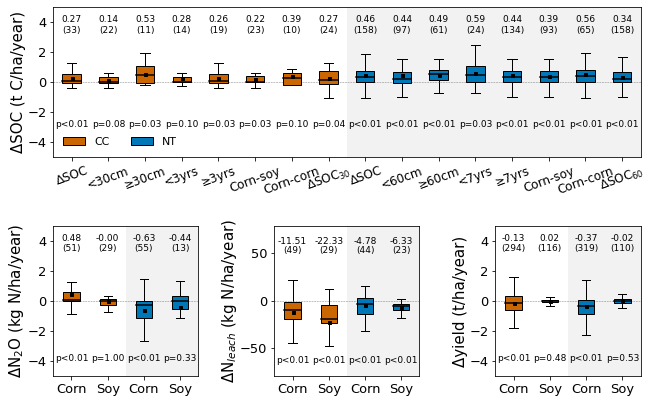

In [39]:
# boxplot the observations
soc_cc = data_soc[data_soc['Experiment'] == 'Cover crops']
soc_nt = data_soc[data_soc['Experiment'] == 'Tillage']
n2o_cc_corn = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (data_n2o['Crop'] == 'Corn')]
n2o_cc_soy = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (data_n2o['Crop'] == 'Soybean')]
n2o_nt_corn = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Tillage') & (data_n2o['Crop'] == 'Corn')]
n2o_nt_soy = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Tillage') & (data_n2o['Crop'] == 'Soybean')]
lch_cc_corn = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (data_lch['Crop'] == 'Corn')]
lch_cc_soy = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (data_lch['Crop'] == 'Soybean')]
lch_nt_corn = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Tillage') & (data_lch['Crop'] == 'Corn')]
lch_nt_soy = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Tillage') & (data_lch['Crop'] == 'Soybean')]
yld_cc_corn = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (data_yld['Crop'] == 'Corn')]
yld_cc_soy = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (data_yld['Crop'] == 'Soybean')]
yld_nt_corn = data_yld['delta_yield'][(data_yld['Experiment'] == 'Tillage') & (data_yld['Crop'] == 'Corn')]
yld_nt_soy = data_yld['delta_yield'][(data_yld['Experiment'] == 'Tillage') & (data_yld['Crop'] == 'Soybean')]

# split data of legume and non-legume cover crops 
n2o_cc_lgm = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (~(data_n2o['Legume'] == 'No'))]
n2o_cc_ngm = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (data_n2o['Legume'] == 'No')]
lch_cc_lgm = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (~(data_lch['Legume'] == 'No'))]
lch_cc_ngm = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (data_lch['Legume'] == 'No')]
yld_cc_lgm = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (~(data_yld['Legume'] == 'No'))]
yld_cc_ngm = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (data_yld['Legume'] == 'No')]
# split data of corn-soy rotation and continuous corn
n2o_cc_rot = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (~(data_n2o['Rotation'] == 'No'))]
n2o_cc_con = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Cover crops') & (data_n2o['Rotation'] == 'No')]
lch_cc_rot = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (~(data_lch['Rotation'] == 'No'))]
lch_cc_con = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Cover crops') & (data_lch['Rotation'] == 'No')]
yld_cc_rot = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (~(data_yld['Rotation'] == 'No'))]
yld_cc_con = data_yld['delta_yield'][(data_yld['Experiment'] == 'Cover crops') & (data_yld['Rotation'] == 'No')]
n2o_nt_rot = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Tillage') & (~(data_n2o['Rotation'] == 'No'))]
n2o_nt_con = data_n2o['delta_N2O'][(data_n2o['Experiment'] == 'Tillage') & (data_n2o['Rotation'] == 'No')]
lch_nt_rot = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Tillage') & (~(data_lch['Rotation'] == 'No'))]
lch_nt_con = data_lch['delta_Nleach'][(data_lch['Experiment'] == 'Tillage') & (data_lch['Rotation'] == 'No')]
yld_nt_rot = data_yld['delta_yield'][(data_yld['Experiment'] == 'Tillage') & (~(data_yld['Rotation'] == 'No'))]
yld_nt_con = data_yld['delta_yield'][(data_yld['Experiment'] == 'Tillage') & (data_yld['Rotation'] == 'No')]

# mode details for delta_SOC data
yi_cc_or = soc_cc['delta_SOC_sameinit'].dropna()
yi_nt_or = soc_nt['delta_SOC_sameinit'].dropna()
yi_cc = soc_cc['delta_SOC_sameinit_30'].dropna()
yi_nt = soc_nt['delta_SOC_sameinit_NTeffect_60'].dropna()
yi_cc_surf = yi_cc_or[soc_cc['Depth'] < 30]
yi_cc_deep = yi_cc_or[soc_cc['Depth'] >= 30]
yi_nt_surf = yi_nt_or[soc_nt['Depth'] < 60]
yi_nt_deep = yi_nt_or[soc_nt['Depth'] >= 60]

yi_cc_con = yi_cc_or[soc_cc['Rotation'] == 'No']
yi_cc_rot = yi_cc_or[~(soc_cc['Rotation'] == 'No')]
yi_nt_con = yi_nt_or[soc_nt['Rotation'] == 'No']
yi_nt_rot = yi_nt_or[~(soc_nt['Rotation'] == 'No')]
yi_cc_ngm = yi_cc_or[soc_cc['Legume'] == 'No']
yi_cc_lgm = yi_cc_or[~(soc_cc['Legume'] == 'No')]
yi_cc_long = yi_cc_or[soc_cc['No_year_SOC'] >= 3]
yi_cc_shrt = yi_cc_or[soc_cc['No_year_SOC'] < 3]
yi_nt_long = yi_nt_or[soc_nt['No_year_SOC'] >= 7]
yi_nt_shrt = yi_nt_or[soc_nt['No_year_SOC'] < 7]
print(yi_cc_shrt.mean(), yi_cc_long.mean(), yi_nt_shrt.mean(), yi_nt_long.mean())

def plot_soil_transform():
    fig0, ax0 = plt.subplots(figsize=(6, 5))
    cmap = ax0.scatter(data_cc.yi, data_cc.yi_30, c = data_cc.Soil_depth, cmap = 'Reds')
    ax0.set_xlabel('Measured ΔSOC')
    ax0.set_ylabel(r'ΔSOC$_{30}$')
    ax0.set_xlim([-5.5,5.5])
    ax0.set_ylim([-5.5,5.5])
    cbar = fig0.colorbar(cmap)
    cbar.set_label('Measured depth (cm)', rotation=270)
    plt.show()
    fig0.savefig(plot_dir + 'SOC_transform_CC.png', dpi=300)

    fig0, ax0 = plt.subplots(figsize=(6, 5))
    cmap = ax0.scatter(data_tl.yi, data_tl.yi_60, c = data_tl.Soil_depth, cmap = 'Reds')
    ax0.set_xlabel('Measured ΔSOC')
    ax0.set_ylabel(r'ΔSOC$_{60}$')
    ax0.set_xlim([-2,3])
    ax0.set_ylim([-2,3])
    cbar = fig0.colorbar(cmap)
    cbar.set_label('Measured depth (cm)', rotation=270)
    plt.show()
    fig0.savefig(plot_dir + 'SOC_transform_NT.png', dpi=300)



# legume vs. non-legume
# yi_soc = [yi_cc_or, yi_cc_surf, yi_cc_deep, yi_cc_shrt, yi_cc_long, yi_cc_lgm, yi_cc_ngm, yi_cc, 
#           yi_nt_or, yi_nt_surf, yi_nt_deep, yi_nt_shrt, yi_nt_long, yi_nt_con, yi_nt_rot, yi_nt]
# yi_oth = [n2o_cc_lgm.dropna(), n2o_cc_ngm.dropna(), n2o_nt_rot.dropna(), n2o_nt_con.dropna(), 
#           lch_cc_lgm.dropna(), lch_cc_ngm.dropna(), lch_nt_rot.dropna(), lch_nt_con.dropna(), 
#           yld_cc_lgm.dropna(), yld_cc_ngm.dropna(), yld_nt_rot.dropna(), yld_nt_con.dropna()]
# yi_oth_all = [yi_oth[0].values.tolist() + yi_oth[1].values.tolist(), yi_oth[2].values.tolist() + yi_oth[3].values.tolist(),
#             yi_oth[4].values.tolist() + yi_oth[5].values.tolist(), yi_oth[6].values.tolist() + yi_oth[7].values.tolist(),
#             yi_oth[8].values.tolist() + yi_oth[9].values.tolist(), yi_oth[10].values.tolist() + yi_oth[11].values.tolist()]
# rotation vs. no rotation
yi_soc = [yi_cc_or, yi_cc_surf, yi_cc_deep, yi_cc_shrt, yi_cc_long, yi_cc_con, yi_cc_rot, yi_cc, 
          yi_nt_or, yi_nt_surf, yi_nt_deep, yi_nt_shrt, yi_nt_long, yi_nt_con, yi_nt_rot, yi_nt]
yi_oth = [n2o_cc_corn.dropna(), n2o_cc_soy.dropna(), n2o_nt_corn.dropna(), n2o_nt_soy.dropna(), 
          lch_cc_corn.dropna(), lch_cc_soy.dropna(), lch_nt_corn.dropna(), lch_nt_soy.dropna(), 
          yld_cc_corn.dropna(), yld_cc_soy.dropna(), yld_nt_corn.dropna(), yld_nt_soy.dropna()]
yi_oth_all = [yi_oth[0].values.tolist() + yi_oth[1].values.tolist(), yi_oth[2].values.tolist() + yi_oth[3].values.tolist(),
            yi_oth[4].values.tolist() + yi_oth[5].values.tolist(), yi_oth[6].values.tolist() + yi_oth[7].values.tolist(),
            yi_oth[8].values.tolist() + yi_oth[9].values.tolist(), yi_oth[10].values.tolist() + yi_oth[11].values.tolist()]
# print('n2o_yi_cc', n2o_yi_cc.mean(), 'n2o_yi_tl', n2o_yi_tl.mean(), 'lch_yi_cc', lch_yi_cc.mean(), 'lch_yi_tl', lch_yi_tl.mean(), 'yld_yi_cc', yld_yi_cc.mean(), 'yld_yi_tl', yld_yi_tl.mean())
lens_soc = [len(i) for i in yi_soc]
means_soc = [i.mean() for i in yi_soc]
lens_oth = [len(i) for i in yi_oth]
means_oth = [i.mean() for i in yi_oth]
lens_oth_all = [len(i) for i in yi_oth_all]
means_oth_all = [np.mean(i) for i in yi_oth_all]
print('len SOC groups', lens_soc, 'mean SOC groups', means_soc, 'len other groups', lens_oth_all, 'mean other groups', means_oth_all)

# student T test for long vs short-term groups
tt_label1 = ['cc_surf vs cc_deep', 'cc_shrt vs cc_long', 'cc_con vs. cc_rot', 
          'nt_surf vs nt_deep', 'nt_shrt vs nt_long', 'nt_con vs nt_rot', 'cc_n2o corn vs soy', 'nt_n2o corn vs soy',
             'cc_lch corn vs soy','nt_lch corn vs soy', 'cc_yld corn vs soy','nt_yld corn vs soy']
tt_label2 = ['soc_cc', 'soc_cc_surf', 'soc_cc_deep', 'soc_cc_shrt', 'soc_cc_long', 'soc_cc_lgm', 'soc_cc_ngm', 'soc_cc_30', 
          'soc_nt', 'soc_nt_surf', 'soc_nt_deep', 'soc_nt_shrt', 'soc_nt_long', 'soc_nt_lgm', 'soc_nt_ngm', 'soc_nt_30']+ \
          ['n2o_cc_lgm', 'n2o_cc_ngm', 'n2o_nt_corn', 'n2o_nt_soy', 
          'lch_cc_lgm', 'lch_cc_ngm', 'lch_nt_corn', 'lch_nt_soy', 
          'yld_cc_lgm', 'yld_cc_ngm', 'yld_nt_corn', 'yld_nt_soy']
# two-sample t test for between groups comparison
for group1, group2, label in zip(yi_soc[1:7:2] + yi_soc[8:14:2] + yi_oth[0::2],
                          yi_soc[2:7:2] + yi_soc[9:14:2] + yi_oth[1::2], tt_label1):
    t1, p1 = stats.ttest_ind(group1, group2)
    print('two-sample t test:', label, 't', t1, 'p', p1)
p_soc, p_oth = [], []
# one-sample t test checking difference of mean from 0
for i, (group, label) in enumerate(zip(yi_soc + yi_oth, tt_label2)):
    t2, p2, = stats.ttest_1samp(group.dropna(), popmean=0)
    print('one-sample t test:', label, 't', t2, 'p', p2)
    if p2 < 0.01:
        p2 = 'p<0.01'
    else:
        p2 = 'p={:.2f}'.format(p2)
    if i < len(yi_soc):
        p_soc.append(p2)
    else:
        p_oth.append(p2)

fig1 = plt.figure(figsize=(9.5, 6))
colors = ['#E64B35FF', '#4DBBD5FF']
colors = ['#FC646A', '#00C6CF']
colors = ['#CA6702', '#0077B6'] # '#023E8A', '#AE2012'
# fig1, axes = plt.subplots(2, 3, figsize=(7, 6))
# ax1, ax2, ax3, ax4 = axes[0, 0:2], axes[1,0], axes[1,1], axes[1,2]
# gs = fig1.add_gridspec(4, 3, wspace=0, hspace=0.1, width_ratios=[1.1, 1, 5])
# ax1 = gs.subplots(sharey='row', sharex='col')
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,3,4)
ax3 = plt.subplot(2,3,5)
ax4 = plt.subplot(2,3,6)
boxprops = dict(color="black",linewidth=1)
medianprops = dict(color="black",linewidth=1.5)
meanprops = dict(marker='s', markerfacecolor='k', markeredgecolor='k', markersize=3)
capprops = None
bp1 = ax1.boxplot(yi_soc, positions=np.arange(1,17,1), showmeans=True, patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
bp2 = ax2.boxplot(yi_oth[:4], positions=np.arange(1,5,1), showmeans=True, patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
bp3 = ax3.boxplot(yi_oth[4:8], positions=np.arange(1,5,1), showmeans=True, patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
bp4 = ax4.boxplot(yi_oth[8:], positions=np.arange(1,5,1), showmeans=True, patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
for bp in (bp1, bp2, bp3, bp4):
    for i, patch in enumerate(bp['boxes']):
        if i < (len(bp['boxes']) / 2):
            patch.set_facecolor(colors[0])
        else:
            patch.set_facecolor(colors[1])

ax1.set_ylim([-5, 5])
ax1.set_xlim([0.5, 16.5])
ax2.set_ylim([-5, 5])
ax2.set_xlim([0.5, 4.5])
ax3.set_ylim([-79, 79])
ax3.set_xlim([0.5, 4.5])
ax4.set_ylim([-5, 5])
ax4.set_xlim([0.5, 4.5])
# xlabels = ['∆SOC', '<30cm', '≥30cm', '<3yrs', '≥3yrs', 'Legume', 'Non-lgm', r'∆SOC$_{30}$',
#            '∆SOC', '<60cm', '≥60cm', '<5yrs', '≥5yrs', 'Corn-soy', 'Corn-corn', r'∆SOC$_{60}$']
# xlabels2 = ['Legume', 'Non-lgm', 'Corn-soy', 'Corn-corn']
xlabels = ['∆SOC', '<30cm', '≥30cm', '<3yrs', '≥3yrs', 'Corn-soy', 'Corn-corn', r'∆SOC$_{30}$', 
           '∆SOC', '<60cm', '≥60cm', '<7yrs', '≥7yrs', 'Corn-soy', 'Corn-corn', r'∆SOC$_{60}$']
xlabels2 = ['Corn', 'Soy', 'Corn', 'Soy']
ax1.set_xticks(range(1,17))
ax1.fill_between([8.5, 16.5], -5, 5, facecolor='gray', alpha=0.1)
# ax1.fill_between([10.5, 14.5], -5, 5, facecolor='gray', alpha=0.1)
ax2.fill_between([2.5, 4.5], -5, 5, facecolor='gray', alpha=0.1)
ax3.fill_between([2.5, 4.5], -80, 80, facecolor='gray', alpha=0.1)
ax4.fill_between([2.5, 4.5], -5, 5, facecolor='gray', alpha=0.1)
ax1.set_xticklabels(xlabels, fontsize=12, rotation = 20)
ax2.set_xticklabels(xlabels2, fontsize=13, rotation = 0)
ax3.set_xticklabels(xlabels2, fontsize=13, rotation = 0)
ax4.set_xticklabels(xlabels2, fontsize=13, rotation = 0)
ax1.tick_params(axis = 'y', labelsize =13)
ax1.set_yticks([-4, -2, 0, 2, 4])
ax2.tick_params(axis = 'y', labelsize =13)
ax3.tick_params(axis = 'y', labelsize =13)
ax4.tick_params(axis = 'y', labelsize =13)
ax1.axhline(y = 0, linestyle = '--', lw=0.5, color = 'gray')
ax2.axhline(y = 0, linestyle = '--', lw=0.5, color = 'gray')
ax3.axhline(y = 0, linestyle = '--', lw=0.5, color = 'gray')
ax4.axhline(y = 0, linestyle = '--', lw=0.5, color = 'gray')
# ax1.text(3.5, -3, 'Cover crop', ha='center', c='k', fontsize=12)
# ax1.text(5.5, -3, 'Reduced tillage', ha='center', c='k', fontsize=12)
# ax1.text(7.5, -3, 'Cover crop', ha='center', c='k', fontsize=12)
# ax1.text(9.5, -3, 'Reduced tillage', ha='center', c='k', fontsize=12)
# heights = [1.2, 3.4, 1.6, 2.3]
heights = [2]*16
v_soc = ['{:.2f}'.format(mean) for mean in means_soc]
n_soc = ['({:d})'.format(len) for len in lens_soc]
v_oth = ['{:.2f}'.format(mean) for mean in means_oth]
n_oth = ['({:d})'.format(len) for len in lens_oth]
ax1.set_ylabel(r'ΔSOC (t C/ha/year)', fontsize=15, labelpad=1)
ax2.set_ylabel(r'ΔN$_2$O (kg N/ha/year)', fontsize=15, labelpad=1)
ax3.set_ylabel(r'ΔN$_{leach}$ (kg N/ha/year)', fontsize=15, labelpad=1)
ax4.set_ylabel(r'Δyield (t/ha/year)', fontsize=15, labelpad=1)
for i in range(0, 16):
    ax1.text(i+1, 4, v_soc[i], ha='center', c='k', fontsize=9)
    ax1.text(i+1, 3.3, n_soc[i], ha='center', c='k', fontsize=9)
    ax1.text(i+1, -3, p_soc[i], ha='center', c='k', fontsize=9)
for i in range(4):
    ax2.text(i + 1, 4, v_oth[i], ha='center', c='k', fontsize=9)
    ax2.text(i + 1, 3.3, n_oth[i], ha='center', c='k', fontsize=9)
    ax2.text(i + 1, -4, p_oth[i], ha='center', c='k', fontsize=9)
    ax3.text(i + 1, 60, v_oth[i+4], ha='center', c='k', fontsize=9)
    ax3.text(i + 1, 50, n_oth[i+4], ha='center', c='k', fontsize=9)
    ax3.text(i + 1, -65, p_oth[i+4], ha='center', c='k', fontsize=9)
    ax4.text(i + 1, 4, v_oth[i+8], ha='center', c='k', fontsize=9)
    ax4.text(i + 1, 3.3, n_oth[i+8], ha='center', c='k', fontsize=9)
    ax4.text(i + 1, -4, p_oth[i+8], ha='center', c='k', fontsize=9)
fig1.tight_layout()
ax1.legend([bp1["boxes"][0], bp1["boxes"][9]], ['CC', 'NT'], loc='lower left', ncol=2, fontsize=11, framealpha=0)
# plt.subplots_adjust(wspace=0.35, hspace=0.3)
plt.show()
fig1.savefig(plot_dir + 'barplot_observations.png', dpi=500)

In [50]:
print(data_n2o['delta_N2O'][data_n2o['Experiment'] == 'Cover crops'].shape)
print(data_n2o['delta_N2O'][data_n2o['Experiment'] == 'Cover crops'][data_n2o['delta_N2O'] > 0].shape)

(80,)
(46,)


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:19: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:23: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


CC: yield number of data: 410
CC: yield number of data with location: 356


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


CC: N$_2$O number of data: 80
CC: N$_2$O number of data with location: 68


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


CC: N$_{leach}$ number of data: 78
CC: N$_{leach}$ number of data with location: 75


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


CC: SOC number of data: 52
CC: SOC number of data with location: 52
NT: yield number of data: 429
NT: yield number of data with location: 310


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


NT: N$_2$O number of data: 68
NT: N$_2$O number of data with location: 65


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


NT: N$_{leach}$ number of data: 67
NT: N$_{leach}$ number of data with location: 62


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


NT: SOC number of data: 392
NT: SOC number of data with location: 267


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


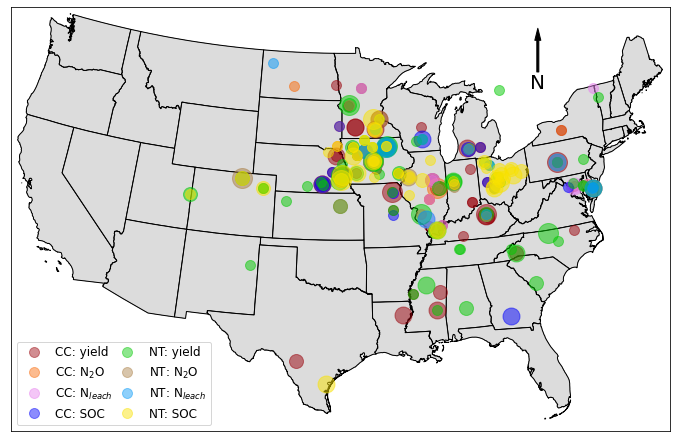

In [40]:
# from metamodel import get_project_root, make_dirs
layered_soc = pd.read_csv(model_inputs_dir + 'meta analysis data-layered SOC.csv')
layered_soc = layered_soc.dropna(subset=['delta_SOC_sameinit'])
soc_cc = layered_soc[layered_soc['Experiment'] == 'Cover crops']
soc_nt = layered_soc[layered_soc['Experiment'] == 'Tillage']
n2o_cc = data_n2o[data_n2o['Experiment'] == 'Cover crops']
n2o_nt = data_n2o[data_n2o['Experiment'] == 'Tillage']
lch_cc = data_lch[data_lch['Experiment'] == 'Cover crops']
lch_nt = data_lch[data_lch['Experiment'] == 'Tillage']
yld_cc = data_yld[data_yld['Experiment'] == 'Cover crops']
yld_nt = data_yld[data_yld['Experiment'] == 'Tillage']

tables = [yld_cc, n2o_cc, lch_cc, soc_cc, yld_nt, n2o_nt, lch_nt, soc_nt]

def plot_map_allObs():
    # plot the map of cover crp sites
    fig1, ax1 = plt.subplots(figsize=(9.5, 7))
    # map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-105, llcrnrlat=35, urcrnrlon=-75, urcrnrlat=50, epsg=5070)
    map = Basemap(lat_0=40, lon_0=-97, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64.5, urcrnrlat=48.5, epsg=5070)
    map.readshapefile('D:/carbon credit/site map/shapefile/st99_d00', 'States',
                      drawbounds=True, color='k', linewidth=0.2)
    map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=False,
                      color='gray', linewidth=0)

    colors = ['#99020b', '#f96908', '#e781ee', '#0000fc', '#03c902', '#a97f45', '#0498f8', '#f9e200']
    labels = ['CC: yield', r'CC: N$_2$O', r'CC: N$_{leach}$', 'CC: SOC', 'NT: yield', r'NT: N$_2$O', r'NT: N$_{leach}$', 'NT: SOC']
    for n, data in enumerate(tables):
        print(labels[n], 'number of data:', data.shape[0])
        data = data.dropna(subset=['Lat', 'Lon'])
        print(labels[n], 'number of data with location:', data.shape[0])
        data[['Lat', 'Lon']] = data[['Lat', 'Lon']].round(5)
        sites = data.groupby(['Lat', 'Lon']).size().reset_index().rename(columns={0: 'Count'}).sort_values(by=['Count'])
        lat = sites['Lat'].tolist()
        lon = sites['Lon'].tolist()
        size = sites['Count'].tolist()
        if n == 0:
            for state, shape in enumerate(map.States):
                poly = Polygon(shape, facecolor='gainsboro', edgecolor='k')
                ax1.add_patch(poly)
                
      
        # ax1.set_title('{}', size=20)
        x, y = map(lon, lat)
        count1, count2, count3, count4 = 1, 1, 1, 1
        for x1, y1, c_n in zip(x, y, size):
            if c_n < 3:
                if count1 == 1:
                    map.plot(x1, y1, 'o', c=colors[n], markersize=10, alpha=0.45, label=labels[n])
                    count1 += 1
                else:
                    map.plot(x1, y1, 'o', c=colors[n], markersize=10, alpha=0.5)
            elif c_n < 6:
                map.plot(x1, y1, 'o', c=colors[n], markersize=14, alpha=0.5)
            elif c_n < 10:
                map.plot(x1, y1, 'o', c=colors[n], markersize=17, alpha=0.5)
            else:
                map.plot(x1, y1, 'o', c=colors[n], markersize=20, alpha=0.5)

    plt.legend(loc='lower left', columnspacing=0.2, fontsize = 12, ncol=2)

    # Add north arrow, https://stackoverflow.com/a/58110049/604456
    x, y, arrow_length = 0.8, 0.95, 0.13
    ax1.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                 arrowprops=dict(facecolor='black', width=2, headwidth=6),
                 ha='center', va='center', fontsize=20,
                 xycoords=ax1.transAxes)
    # Add scale-bar
    # x, y, scale_len = 90000, 200000, 500000  # arrowstyle='-'
    # scale_rect = mpl.patches.Rectangle((x, y), scale_len, 200, linewidth=2, edgecolor='k', facecolor='k')
    # ax1.add_patch(scale_rect)
    # plt.text(x + scale_len / 2, y + 15000, s='500 km', fontsize=20, horizontalalignment='center')     
    fig1.tight_layout()
    plt.show()
#     fig1.savefig(plot_dir + 'sitemap_2024.png', dpi=500)

plot_map_allObs()

In [44]:
tables = [layered_soc, data_n2o, data_lch, data_yld]

county_shape = shapefile.Reader('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m')
# find counties that contain observations
obs_county_fips = []
for data in [data_n2o, data_lch, data_soc, data_yld]:
    data = data.dropna(subset=['Lat', 'Lon'])
    data[['Lat', 'Lon']] = data[['Lat', 'Lon']].round(5)
    sites = data.groupby(['Lat', 'Lon']).size().reset_index().rename(columns={0: 'Count'}).sort_values(by=['Count'])
    lat = sites['Lat'].tolist()
    lon = sites['Lon'].tolist()

    for info, shape in zip(county_shape.records(), county_shape.shapes()):
        county_polygon = shapePolygon(shape.points)
        for x, y in zip(lon, lat):
            site_point = Point(x, y)
            if county_polygon.contains(site_point):
                fips = int(info['GEOID'])
    #           print(fips,x, y, site_point)
                obs_county_fips.append(fips)
    
    
print((set(obs_county_fips)), len(obs_county_fips))

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\pandas\core\frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

{28161, 27149, 1047, 27161, 1049, 22041, 42027, 1087, 19015, 21067, 19037, 42077, 19039, 39019, 39023, 39031, 19063, 39033, 19067, 17019, 17021, 39041, 38017, 39049, 19081, 17037, 19093, 39069, 37021, 21151, 18079, 17059, 38059, 39083, 37037, 36019, 19125, 17077, 39097, 18107, 17087, 20161, 19141, 39109, 39117, 19151, 19153, 19155, 18135, 19161, 17113, 38105, 39131, 35037, 37083, 19169, 39137, 48355, 20193, 21227, 18157, 55021, 19183, 55025, 39159, 17143, 17145, 37115, 17149, 17151, 39169, 39173, 18183, 55049, 17163, 10005, 36123, 17187, 27127, 37157, 31021, 31023, 31035, 31051, 48463, 50001, 29019, 55137, 31081, 49019, 29051, 31107, 31109, 8069, 27019, 27021, 27037, 26015, 31137, 51107, 29103, 31155, 8121, 46011, 47037, 28101, 28105, 24011, 46027, 26065, 45011, 24027, 26077, 13277, 24033, 24035, 28151}


117 False    14955
True       585
Name: FIPS, dtype: int64
['State', 'County', 'Lon', 'Lat', 'CCGDD', 'MCGDD', 'MAP', 'SPP', 'GSP', 'MAT', 'NSR', 'VPD', 'pH', 'BD', 'Clay', 'Silt', 'Sand', 'Ks', 'FC', 'CEC', 'gSOC_gkg', 'gSOC_tha', 'FIPS']


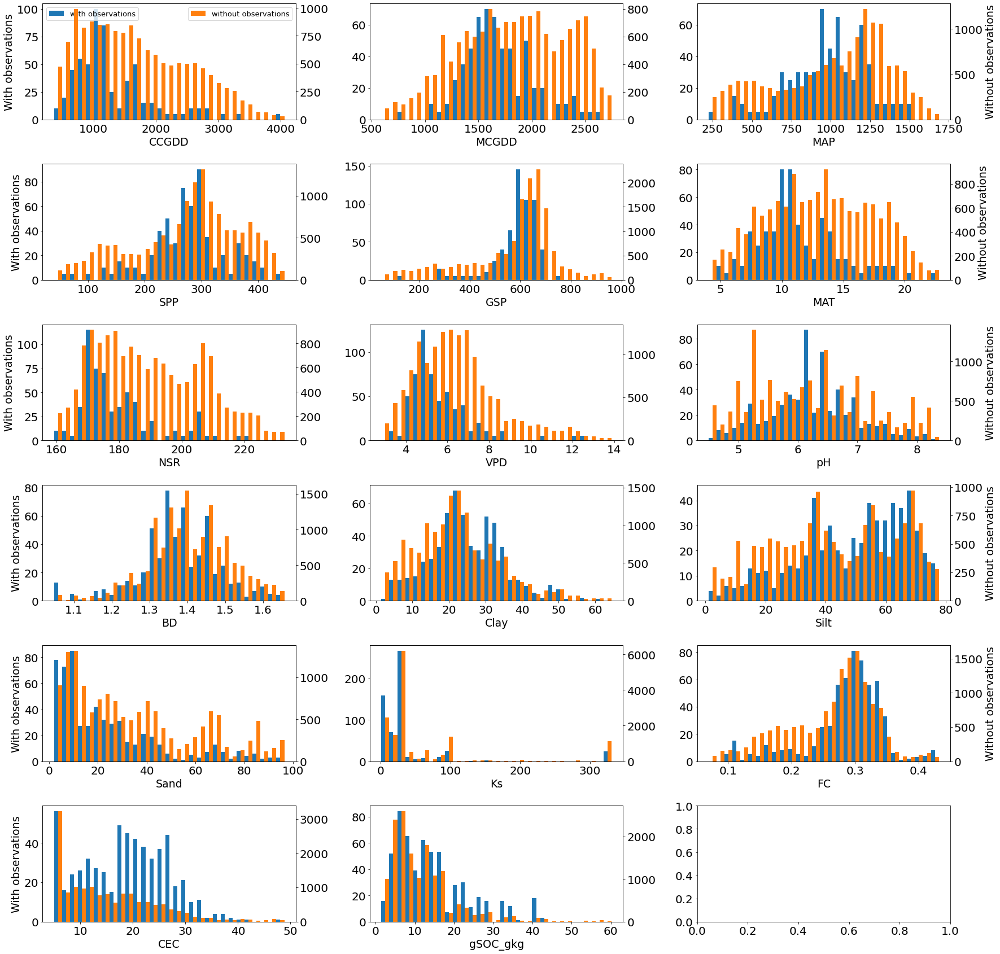

In [105]:
obs_county_fips = set(obs_county_fips)
County_inputs = pd.read_csv('D:/carbon credit/metaforest/county_project/inputs/County_inputs.csv', index_col = 0)
# field_data = pd.read_csv(data_dir + 'model inputs_2405/meta analysis data-cumulative SOC.csv')
FIPS = County_inputs['FIPS'].str.split('_').str[0].astype(int)
with_obs = FIPS.isin(obs_county_fips)

print(len(obs_county_fips), with_obs.value_counts())
vars_list = County_inputs.columns.tolist()
print(vars_list)

fig, axes = plt.subplots(6,3, figsize=(25, 24))

for n, var in enumerate(vars_list[4:-2]):
    ax1 = axes[n//3, n%3]
    obs_var = County_inputs[var][with_obs == True]
    noobs_var = County_inputs[var][with_obs == False]
    
    bins = np.linspace(County_inputs[var].quantile(0.01), County_inputs[var].quantile(0.99), 30)  # Define bin edges
    counts1, _ = np.histogram(obs_var, bins=bins)
    counts2, _ = np.histogram(noobs_var, bins=bins)
 
    width = (bins[1] - bins[0]) / 2
    ax1.bar(bins[:-1], counts1, width=width, align='edge', label='with observations')
    ax2 = ax1.twinx()
    ax2.bar(bins[:-1] + width, counts2, width=width, align='edge', label='without observations', color = 'tab:orange')
    if n == 0:
        ax1.legend(loc='upper left',fontsize = 13)
        ax2.legend(loc='upper right',fontsize = 13)
    ax1.set_xlabel(var,fontsize = 19)
#     ax1.set_xticklabels(fontsize = 12)
#     ax1.set_yticklabels(fontsize = 12)
    if n % 3 == 0:
        ax1.set_ylabel('With observations',fontsize = 19)
    if n %3 == 2:
        ax2.set_ylabel('Without observations',fontsize = 19)
fig.tight_layout()
fig.savefig(plot_dir + 'histgram_vars.png', dpi=500)

Lat        Lon       
31.476400  -83.527900         NaN
37.434700  -88.667800    0.229885
38.530000  -92.170000    1.073171
39.020000  -77.480000    0.000000
39.960000  -92.100000    1.192931
40.086900  -88.370300   -0.236637
40.170000  -84.130000    0.714039
40.566700  -98.133300   -0.223214
40.580000  -98.140000    0.582738
41.150000  -96.400000    0.558036
41.326111  -97.311940   -1.444392
41.916670  -93.750000    0.014571
42.020000  -93.770000   -0.204000
42.034720  -93.619720   -0.174636
42.430000  -84.280000   -0.094234
43.280000  -89.380000    0.530066
44.305714  -96.670567    1.240000
Name: delta_SOC_sameinit_30, dtype: float64


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:23: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


CC: SOC number of data: 43
CC: SOC number of data with location: 43


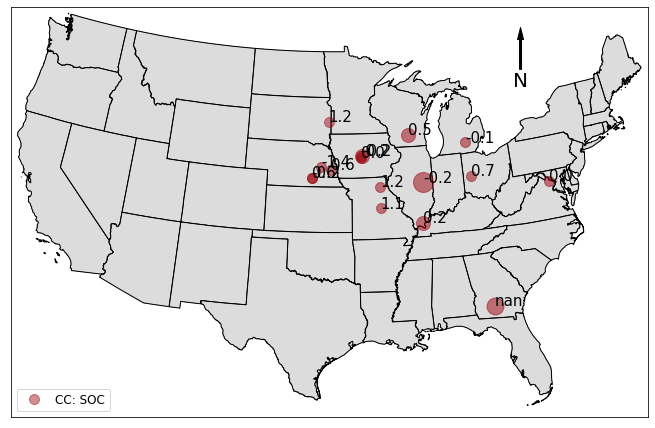

In [31]:
# from metamodel import get_project_root, make_dirs
# layered_soc = pd.read_csv(model_inputs_dir + 'meta analysis data-layered SOC.csv')
# layered_soc = layered_soc.dropna(subset=['delta_SOC_sameinit'])
data_soc = pd.read_csv(model_inputs_dir + 'SOC_model_inputs.csv')
data_soc = data_soc.dropna(subset=['delta_SOC_sameinit'])
soc_cc = data_soc[data_soc['Experiment'] == 'Cover crops']
soc_nt = data_soc[data_soc['Experiment'] == 'Tillage']
n2o_cc = data_n2o[data_n2o['Experiment'] == 'Cover crops']
n2o_nt = data_n2o[data_n2o['Experiment'] == 'Tillage']
lch_cc = data_lch[data_lch['Experiment'] == 'Cover crops']
lch_nt = data_lch[data_lch['Experiment'] == 'Tillage']
yld_cc = data_yld[data_yld['Experiment'] == 'Cover crops']
yld_nt = data_yld[data_yld['Experiment'] == 'Tillage']
print(soc_cc.groupby(['Lat', 'Lon']).mean()['delta_SOC_sameinit_30'])
tables = [soc_cc]

def plot_map_allObs():
    # plot the map of cover crp sites
    fig1, ax1 = plt.subplots(figsize=(9.5, 7))
    # map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-105, llcrnrlat=35, urcrnrlon=-75, urcrnrlat=50, epsg=5070)
    map = Basemap(lat_0=40, lon_0=-97, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64.5, urcrnrlat=48.5, epsg=5070)
    map.readshapefile('D:/carbon credit/site map/shapefile/st99_d00', 'States',
                      drawbounds=True, color='k', linewidth=0.2)

    colors = ['#99020b', '#f96908', '#e781ee', '#0000fc', '#03c902', '#a97f45', '#0498f8', '#f9e200']
    labels = ['CC: SOC']
    for n, data in enumerate(tables):
        print(labels[n], 'number of data:', data.shape[0])
        data = data.dropna(subset=['Lat', 'Lon'])
        print(labels[n], 'number of data with location:', data.shape[0])
        data[['Lat', 'Lon']] = data[['Lat', 'Lon']].round(5)
        sites = data.groupby(['Lat', 'Lon']).size().reset_index().rename(columns={0: 'Count'}).sort_values(by=['Count'])
        lat = sites['Lat'].tolist()
        lon = sites['Lon'].tolist()
        size = sites['Count'].tolist()
        
        for info, shape in enumerate(map.States):
            poly = Polygon(shape, facecolor='gainsboro', edgecolor='k')
            ax1.add_patch(poly)

        # ax1.set_title('{}', size=20)
        x, y = map(lon, lat)
        count1, count2, count3, count4 = 1, 1, 1, 1
        for i, (x1, y1, c) in enumerate(zip(x, y, size)):
            obs = data['delta_SOC_sameinit_30'][data['Lat'].round(5) == lat[i]].mean()
            if c < 3:
                if count1 == 1:
                    map.plot(x1, y1, 'o', c=colors[n], markersize=10, alpha=0.45, label=labels[n])
                    count1 += 1
                    plt.annotate('{:.1f}'.format(obs), xy=(x1, y1), fontsize = 15)
                else:
                    map.plot(x1, y1, 'o', c=colors[n], markersize=10, alpha=0.5)
                    plt.annotate('{:.1f}'.format(obs), xy=(x1, y1), fontsize = 15)
            elif c < 6:
                map.plot(x1, y1, 'o', c=colors[n], markersize=14, alpha=0.5)
                plt.annotate('{:.1f}'.format(obs), xy=(x1, y1), fontsize = 15)
            elif c < 10:
                map.plot(x1, y1, 'o', c=colors[n], markersize=17, alpha=0.5)
                plt.annotate('{:.1f}'.format(obs), xy=(x1, y1), fontsize = 15)
            else:
                map.plot(x1, y1, 'o', c=colors[n], markersize=20, alpha=0.5)
                plt.annotate('{:.1f}'.format(obs), xy=(x1, y1), fontsize = 15)

    plt.legend(loc='lower left', columnspacing=0.2, fontsize = 12, ncol=2)

    # Add north arrow, https://stackoverflow.com/a/58110049/604456
    x, y, arrow_length = 0.8, 0.95, 0.13
    ax1.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                 arrowprops=dict(facecolor='black', width=2, headwidth=6),
                 ha='center', va='center', fontsize=20,
                 xycoords=ax1.transAxes)
    # Add scale-bar
    # x, y, scale_len = 90000, 200000, 500000  # arrowstyle='-'
    # scale_rect = mpl.patches.Rectangle((x, y), scale_len, 200, linewidth=2, edgecolor='k', facecolor='k')
    # ax1.add_patch(scale_rect)
    # plt.text(x + scale_len / 2, y + 15000, s='500 km', fontsize=20, horizontalalignment='center')
    fig1.tight_layout()
    plt.show()
#     fig1.savefig(plot_dir + 'sitemap_2024.png', dpi=500)
plot_map_allObs()

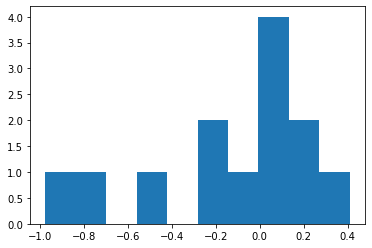

In [26]:
soc_il = soc_cc['delta_SOC_sameinit_30'][soc_cc['State'] == 'IL']
fig, ax = plt.subplots()
plt.hist(soc_il)
plt.show()

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  


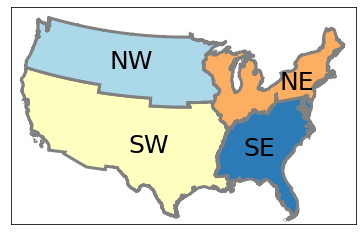

In [83]:
def plot_map_subregion():
    fig1, ax1 = plt.subplots(figsize=(6.5, 4))
    colors = ['#2c7bb6', '#ffffbf', '#fdae61', '#abd9e9']
    # map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-105, llcrnrlat=35, urcrnrlon=-75, urcrnrlat=50, epsg=5070)
    map = Basemap(lat_0=40, lon_0=-98, llcrnrlon=-120, llcrnrlat=22, urcrnrlon=-62.5, urcrnrlat=49, epsg=5070)
    map.readshapefile('D:/carbon credit/site map/shapefile/subregion_map_24/subregion_24', 'Subregion', drawbounds=True, color='k', linewidth=0)
    # map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
    #                   color='gray', linewidth=0.1)
    # map.fillcontinents(color='gray', zorder=0)
    # map.drawcountries(linewidth=2)
    # map.drawcoastlines()
    # print(map.Subregion_info)
    for i, Subregion_id in enumerate(map.Subregion_info):
        id = int(Subregion_id['Subregion']) - 1
        color = colors[id]
        poly = Polygon(map.Subregion[i], linewidth=3, facecolor=color, edgecolor='gray')
        ax1.add_patch(poly)

#     locations = [(0.35, 0.75), (0.3, 0.36), (0.58, 0.55), (0.72, 0.35)]
#     names = ['UM+NW', 'SC+SW', 'LM+NE', 'SE']
    locations = [(0.35, 0.75), (0.4, 0.36), (0.83, 0.65), (0.72, 0.35)]
    names = ['NW', 'SW', 'NE', 'SE']
    for i, (x, y) in enumerate(locations):
        ax1.annotate(names[i], xy=(x, y), xytext=(x, y),
                     ha='center', va='center', fontsize=25,
                     xycoords=ax1.transAxes)
    plt.show()
    fig1.savefig(plot_dir + 'subregion_new.png', dpi=300)
plot_map_subregion()

number of SOC_CC obs in UM_NW, LM_NE, SC_SW, SE [6, 27, 0, 1]
number of SOC_NT obs in UM_NW, LM_NE, SC_SW, SE [4, 51, 4, 0]
number of yld_CC obs in UM_NW, LM_NE, SC_SW, SE [39, 240, 12, 27]
number of yld_NT obs in UM_NW, LM_NE, SC_SW, SE [18, 147, 6, 40]
-0.09421623428062874
-0.4627609028539679


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is

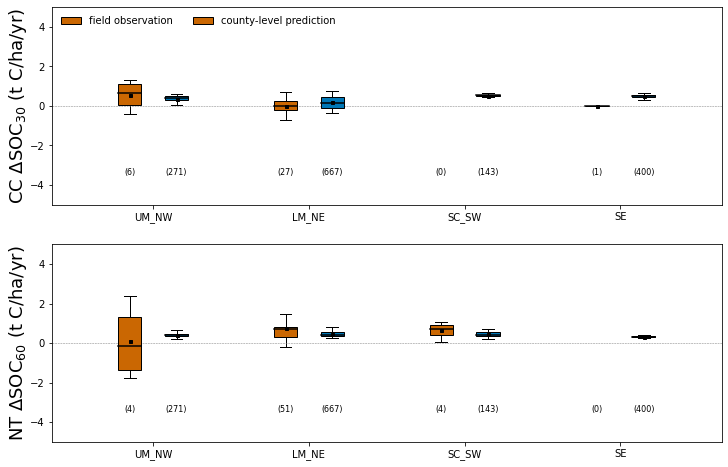

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is

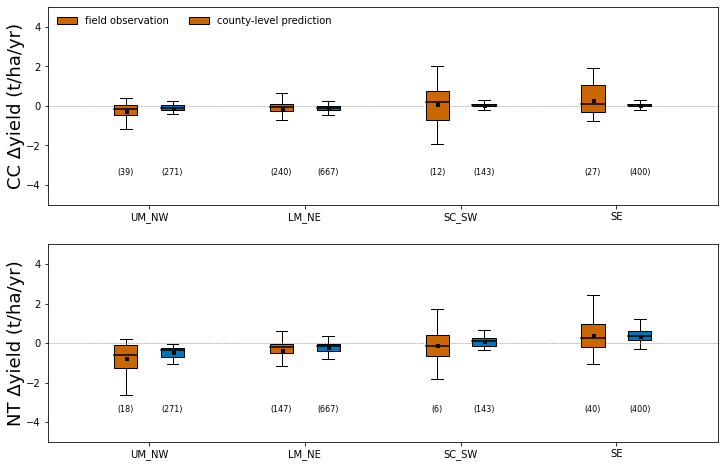

91    2.386899
92   -1.243158
93    0.952073
94   -1.750990
Name: delta_SOC_sameinit_60, dtype: float64


In [4]:
def sim_obs_subregion():
    data_soc = pd.read_csv(model_inputs_dir + 'SOC_model_inputs.csv')
    data_n2o = pd.read_csv(model_inputs_dir + 'N2O_model_inputs.csv')
    data_lch = pd.read_csv(model_inputs_dir + 'Nleach_model_inputs.csv')
    data_yld = pd.read_csv(model_inputs_dir + 'yld_model_inputs.csv')
#     county_sum = pd.read_csv(model_outputs_dir + '/metaforest_county_prediction.csv', index_col=0)
#     corn_area = county_sum['corn_area']
    pred_cty = pd.read_csv(county_outputs_dir + 'county_pred.csv')
    pred_cty = pred_cty[pred_cty['corn_area'] > 0]

    soc_cc = data_soc[data_soc['Experiment'] == 'Cover crops'].dropna(subset=['delta_SOC_sameinit_30'])
    soc_cc = soc_cc.dropna(subset=['Lat', 'Lon'])
    soc_nt = data_soc[data_soc['Experiment'] == 'Tillage'].dropna(subset=['delta_SOC_sameinit_60'])
    soc_nt = soc_nt.dropna(subset=['Lat', 'Lon', 'Nrate'])
    yld_cc = data_yld[data_yld['Experiment'] == 'Cover crops'].dropna(subset=['delta_yield'])
    yld_cc = yld_cc.dropna(subset=['Lat', 'Lon', 'Nrate'])
    yld_nt = data_yld[data_yld['Experiment'] == 'Tillage'].dropna(subset=['delta_yield'])
    yld_nt = yld_nt.dropna(subset=['Lat', 'Lon', 'Nrate'])
    soc_nt_lt = soc_nt[soc_nt['No_year_SOC'] >= 7]
    
    # define four subregions
    # upper Midwest + north west
    UM_NW = {'MN':27, 'ND':38, 'SD':46, 'WI':55, 'MI':26, 'ID':16, 'OR':41, 'WA':53, 'MT':30, 'WY':56}
    # lower Midwest + north east
    LM_NE = {'IL':17, 'IN':18, 'IA':19, 'KS':20,  'MA':25, 'MO':29, 'NE':31, 'NY':36, 'OH':39, 'PA':42, 'VT':50, 'CT':9, 'NJ':34, 'ME':23, 'NH':33, 'RI':44}
    # south central and south west
    SC_SW = {'AR':5, 'CA':6, 'CO':8, 'LA':22, 'TX':48, 'NM':35, 'NV':32, 'OK':40, 'AZ':4, 'UT':49}
    # south east
    SE =  {'AL':1, 'MD':24, 'DE':10, 'FL':12, 'GA':13, 'KY':21, 'VA':51, 'TN':47, 'NC':37, 'SC':45, 'MS':28, 'WV':54}


    soc_cc_cc = soc_cc[~(soc_cc['Rotation'] == 'Yes')]
    soc_cc_cs = soc_cc[~(soc_cc['Rotation'] == 'No')]
    soc_nt_cc = soc_nt_lt[~(soc_nt_lt['Rotation'] == 'Yes')]
    soc_nt_cs = soc_nt_lt[~(soc_nt_lt['Rotation'] == 'No')]

    yld_cc_cc = yld_cc[~(yld_cc['Rotation'] == 'Yes')]
    yld_cc_cs = yld_cc[~(yld_cc['Rotation'] == 'No')]
    yld_nt_cc = yld_nt[~(yld_nt['Rotation'] == 'Yes')]
    yld_nt_cs = yld_nt[~(yld_nt['Rotation'] == 'No')]

    prd_soc_cc_cc = pred_cty['Rot_delta_SOC_30']
    prd_soc_cc_cs = pred_cty['Con_delta_SOC_30']
    prd_soc_nt_cc = pred_cty['Rot_delta_SOC_60']
    prd_soc_nt_cs = pred_cty['Con_delta_SOC_60']
    prd_yld_cc_cc = pred_cty['Con_delta_yld_cc']
    prd_yld_cc_cs = pd.concat((pred_cty['Rot_delta_yld_cc_corn'],pred_cty['Rot_delta_yld_cc_soy']), axis = 1)
    prd_yld_nt_cc = pred_cty['Con_delta_yld_nt']
    prd_yld_nt_cs = pd.concat((pred_cty['Rot_delta_yld_nt_corn'],pred_cty['Rot_delta_yld_nt_soy']), axis = 1)
    obs_soc_cc_cc_sub = [soc_cc_cc['delta_SOC_sameinit_30'][soc_cc_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_cc_cs_sub = [soc_cc_cs['delta_SOC_sameinit_30'][soc_cc_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_cc_sub = [soc_cc['delta_SOC_sameinit_30'][soc_cc['State'].isin(subregion)] \
                      for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_nt_sub = [soc_nt_lt['delta_SOC_sameinit_60'][soc_nt_lt['State'].isin(subregion)] \
                      for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]

    prd_soc_cc_cc_sub = [prd_soc_cc_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_cc_cs_sub = [prd_soc_cc_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_cc_sub = [np.append(i,j) for (i,j) in zip(prd_soc_cc_cc_sub, prd_soc_cc_cs_sub)]
    prd_soc_nt_cc_sub = [prd_soc_nt_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_nt_cs_sub = [prd_soc_nt_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_nt_sub = [np.append(i,j) for (i,j) in zip(prd_soc_nt_cc_sub, prd_soc_nt_cs_sub)]

    obs_yld_cc_cc_sub = [yld_cc_cc['delta_yield'][yld_cc_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_cc_cs_sub = [yld_cc_cs['delta_yield'][yld_cc_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_cc_sub = [np.append(i,j) for (i,j) in zip(obs_yld_cc_cc_sub, obs_yld_cc_cs_sub)]
    obs_yld_nt_cc_sub = [yld_nt_cc['delta_yield'][yld_nt_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_nt_cs_sub = [yld_nt_cs['delta_yield'][yld_nt_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_nt_sub = [np.append(i,j) for (i,j) in zip(obs_yld_nt_cc_sub, obs_yld_nt_cs_sub)]
    print('number of SOC_CC obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_soc_cc_sub])
    print('number of SOC_NT obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_soc_nt_sub])
    print('number of yld_CC obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_yld_cc_sub])
    print('number of yld_NT obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_yld_nt_sub])


    prd_yld_cc_cc_sub = [prd_yld_cc_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_cc_cs_sub = [prd_yld_cc_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_cc_sub = [np.append(i,j) for (i,j) in zip(prd_yld_cc_cc_sub, prd_yld_cc_cs_sub)]
    prd_yld_cc_sub = [prd.flatten() for prd in prd_yld_cc_sub]
    prd_yld_nt_cc_sub = [prd_yld_nt_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_nt_cs_sub = [prd_yld_nt_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_nt_sub = [np.append(i,j) for (i,j) in zip(prd_yld_nt_cc_sub, prd_yld_nt_cs_sub)]
    prd_yld_nt_sub = [prd.flatten() for prd in prd_yld_nt_sub]
    print(prd_yld_cc_sub[0].mean())
    print(prd_yld_nt_sub[0].mean())

    
    

    fig1, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    colors = ['#E64B35FF', '#4DBBD5FF']
    colors = ['#FC646A', '#00C6CF']
    colors = ['#CA6702', '#0077B6'] # '#023E8A', '#AE2012'

    boxprops = dict(color="black",linewidth=1)
    medianprops = dict(color="black",linewidth=1.5)
    meanprops = dict(marker='s', markerfacecolor='k', markeredgecolor='k', markersize=3)
    capprops = None

    x_loc = np.arange(1, 5)

    bp1 = ax1.boxplot(obs_soc_cc_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp2 = ax1.boxplot(prd_soc_cc_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp3 = ax2.boxplot(obs_soc_nt_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp4 = ax2.boxplot(prd_soc_nt_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)

    for i, bp in enumerate([bp1, bp2, bp3, bp4]):
        for patch in (bp['boxes']):
            if i in [0, 2]:
                patch.set_facecolor(colors[0])
            else:
                patch.set_facecolor(colors[1])

    xlabels = ['UM_NW', 'LM_NE', 'SC_SW', 'SE']
    ax1.set_xticks(range(1, 5))
    ax2.set_xticks(range(1, 5))
    ax1.set_xticklabels(xlabels)
    ax2.set_xticklabels(xlabels)
    # ax1.set_ylim([-3, 3])
    # ax2.set_ylim([-3, 3])
    ax1.set_ylim([-5, 5])
    ax2.set_ylim([-5, 5])
    ax1.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax2.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax1.legend([bp1['boxes'][0], bp3['boxes'][0]], ['field observation', \
                                                    'county-level prediction'], ncol=2, loc = 'upper left', framealpha=0)
    ax1.set_ylabel(r'CC ΔSOC$_{30}$ (t C/ha/yr)', fontsize=18, labelpad=1)
    ax2.set_ylabel(r'NT ΔSOC$_{60}$ (t C/ha/yr)', fontsize=18, labelpad=1)

    len_soc_cc_obs = [len(i) for i in obs_soc_cc_sub]
    len_soc_cc_prd = [len(i) for i in prd_yld_cc_cs_sub]
    len_soc_nt_obs = [len(i) for i in obs_soc_nt_sub]
    len_soc_nt_prd = [len(i) for i in prd_yld_nt_cs_sub]

    for i in range(0, 4):
        # ax1.text(i+1, 4, v_soc[i], ha='center', c='k', fontsize=8)
        ax1.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_soc_cc_obs[i]), ha='center', c='k', fontsize=8)
        ax1.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_soc_cc_prd[i]), ha='center', c='k', fontsize=8)
        ax2.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_soc_nt_obs[i]), ha='center', c='k', fontsize=8)
        ax2.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_soc_nt_prd[i]), ha='center', c='k', fontsize=8)

    plt.show()
    fig1.savefig(plot_dir + 'subregion_boxplot_soc.png', dpi=300)

    
    
    
    fig2, (ax3, ax4) = plt.subplots(2, 1, figsize=(12, 8))
    colors = ['#E64B35FF', '#4DBBD5FF']
    colors = ['#FC646A', '#00C6CF']
    colors = ['#CA6702', '#0077B6'] # '#023E8A', '#AE2012'

    boxprops = dict(color="black",linewidth=1)
    medianprops = dict(color="black",linewidth=1.5)
    meanprops = dict(marker='s', markerfacecolor='k', markeredgecolor='k', markersize=3)
    capprops = None

    x_loc = np.arange(1, 5)

    bp5 = ax3.boxplot(obs_yld_cc_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp6 = ax3.boxplot(prd_yld_cc_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp7 = ax4.boxplot(obs_yld_nt_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp8 = ax4.boxplot(prd_yld_nt_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)

    for i, bp in enumerate([bp5, bp6, bp7, bp8]):
        for patch in (bp['boxes']):
            if i in [0, 2]:
                patch.set_facecolor(colors[0])
            else:
                patch.set_facecolor(colors[1])

    xlabels = ['UM_NW', 'LM_NE', 'SC_SW', 'SE']
    ax3.set_xticks(range(1, 5))
    ax4.set_xticks(range(1, 5))
    ax3.set_xticklabels(xlabels)
    ax4.set_xticklabels(xlabels)
    # ax1.set_ylim([-3, 3])
    # ax2.set_ylim([-3, 3])
    ax3.set_ylim([-5, 5])
    ax4.set_ylim([-5, 5])
    ax3.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax4.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax3.legend([bp5['boxes'][0], bp7['boxes'][0]], ['field observation', 'county-level prediction'], \
               ncol=2, loc = 'upper left', framealpha=0)
    ax3.set_ylabel(r'CC Δyield (t/ha/yr)', fontsize=18, labelpad=1)
    ax4.set_ylabel(r'NT Δyield (t/ha/yr)', fontsize=18, labelpad=1)

    len_yld_cc_obs = [len(i) for i in obs_yld_cc_sub]
    len_yld_cc_prd = [len(i) for i in prd_yld_cc_cs_sub]
    len_yld_nt_obs = [len(i) for i in obs_yld_nt_sub]
    len_yld_nt_prd = [len(i) for i in prd_yld_nt_cs_sub]

    for i in range(0, 4):
        # ax1.text(i+1, 4, v_soc[i], ha='center', c='k', fontsize=8)
        ax3.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_yld_cc_obs[i]), ha='center', c='k', fontsize=8)
        ax3.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_yld_cc_prd[i]), ha='center', c='k', fontsize=8)
        ax4.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_yld_nt_obs[i]), ha='center', c='k', fontsize=8)
        ax4.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_yld_nt_prd[i]), ha='center', c='k', fontsize=8)

    plt.show()
    fig2.savefig(plot_dir + 'subregion_boxplot_yld.png', dpi=300)
    
    print(obs_soc_nt_sub[0])
    
sim_obs_subregion()

number of SOC_CC obs in UM_NW, LM_NE, SC_SW, SE [12, 19, 2, 10]
number of SOC_NT obs in UM_NW, LM_NE, SC_SW, SE [78, 43, 9, 4]
number of yld_CC obs in UM_NW, LM_NE, SC_SW, SE [140, 57, 132, 81]
number of yld_NT obs in UM_NW, LM_NE, SC_SW, SE [178, 146, 20, 85]
-0.1570945812214206
-0.3840851959268183


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is

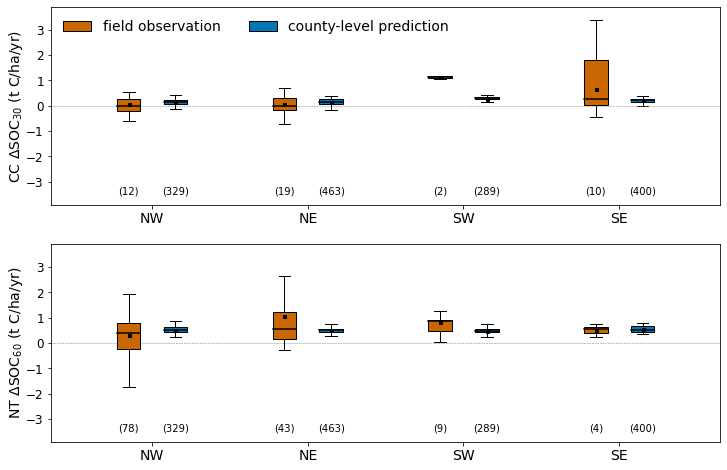

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is

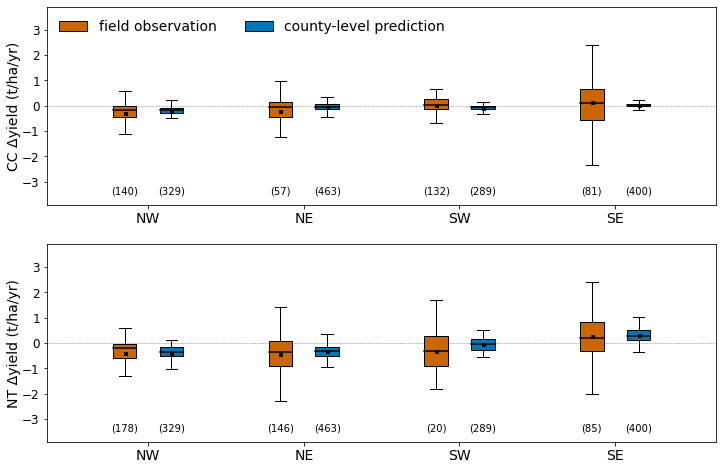

In [76]:
def sim_obs_subregion():
    data_soc = pd.read_csv(model_inputs_dir + 'SOC_model_inputs.csv')
    data_n2o = pd.read_csv(model_inputs_dir + 'N2O_model_inputs.csv')
    data_lch = pd.read_csv(model_inputs_dir + 'Nleach_model_inputs.csv')
    data_yld = pd.read_csv(model_inputs_dir + 'yld_model_inputs.csv')
#     county_sum = pd.read_csv(model_outputs_dir + '/metaforest_county_prediction.csv', index_col=0)
#     corn_area = county_sum['corn_area']
    pred_cty = pd.read_csv(county_outputs_dir + 'county_pred.csv')
    pred_cty = pred_cty[pred_cty['corn_area'] > 0]

    soc_cc = data_soc[data_soc['Experiment'] == 'Cover crops'].dropna(subset=['delta_SOC_sameinit_30'])
#     soc_cc = soc_cc.dropna(subset=['Lat', 'Lon'])
    soc_nt = data_soc[data_soc['Experiment'] == 'Tillage'].dropna(subset=['delta_SOC_sameinit_60'])
#     soc_nt = soc_nt.dropna(subset=['Lat', 'Lon', 'Nrate'])
    yld_cc = data_yld[data_yld['Experiment'] == 'Cover crops'].dropna(subset=['delta_yield'])
#     yld_cc = yld_cc.dropna(subset=['Lat', 'Lon', 'Nrate'])
    yld_nt = data_yld[data_yld['Experiment'] == 'Tillage'].dropna(subset=['delta_yield'])
#     yld_nt = yld_nt.dropna(subset=['Lat', 'Lon', 'Nrate'])
    soc_nt_lt = soc_nt[soc_nt['No_year_SOC'] >= 7]
    
    # define four subregions
    # upper Midwest + north west
    UM_NW = {'IA':19, 'NE':31, 'MN':27, 'ND':38, 'SD':46, 'ID':16, 'OR':41, 'WA':53, 'MT':30, 'WY':56}
    # lower Midwest + north east
    LM_NE = {'WI':55, 'MI':26, 'IL':17, 'IN':18, 'MA':25, 'NY':36, 'OH':39, 'PA':42, 'VT':50, 'CT':9, 'NJ':34, 'ME':23, 'NH':33, 'RI':44}
    # south central and south west
    SC_SW = {'KS':20, 'MO':29, 'AR':5, 'CA':6, 'CO':8, 'LA':22, 'TX':48, 'NM':35, 'NV':32, 'OK':40, 'AZ':4, 'UT':49}
    # south east
    SE =  {'AL':1, 'MD':24, 'DE':10, 'FL':12, 'GA':13, 'KY':21, 'VA':51, 'TN':47, 'NC':37, 'SC':45, 'MS':28, 'WV':54}


    soc_cc_cc = soc_cc[~(soc_cc['Rotation'] == 'Yes')]
    soc_cc_cs = soc_cc[~(soc_cc['Rotation'] == 'No')]
    soc_nt_cc = soc_nt_lt[~(soc_nt_lt['Rotation'] == 'Yes')]
    soc_nt_cs = soc_nt_lt[~(soc_nt_lt['Rotation'] == 'No')]

    yld_cc_cc = yld_cc[~(yld_cc['Rotation'] == 'Yes')]
    yld_cc_cs = yld_cc[~(yld_cc['Rotation'] == 'No')]
    yld_nt_cc = yld_nt[~(yld_nt['Rotation'] == 'Yes')]
    yld_nt_cs = yld_nt[~(yld_nt['Rotation'] == 'No')]

    prd_soc_cc_cc = pred_cty['Rot_delta_SOC_30']
    prd_soc_cc_cs = pred_cty['Con_delta_SOC_30']
    prd_soc_nt_cc = pred_cty['Rot_delta_SOC_60']
    prd_soc_nt_cs = pred_cty['Con_delta_SOC_60']
    prd_yld_cc_cc = pred_cty['Con_delta_yld_cc']
    prd_yld_cc_cs = pd.concat((pred_cty['Rot_delta_yld_cc_corn'],pred_cty['Rot_delta_yld_cc_soy']), axis = 1)
    prd_yld_nt_cc = pred_cty['Con_delta_yld_nt']
    prd_yld_nt_cs = pd.concat((pred_cty['Rot_delta_yld_nt_corn'],pred_cty['Rot_delta_yld_nt_soy']), axis = 1)
    obs_soc_cc_cc_sub = [soc_cc_cc['delta_SOC_sameinit_30'][soc_cc_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_cc_cs_sub = [soc_cc_cs['delta_SOC_sameinit_30'][soc_cc_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_cc_sub = [soc_cc['delta_SOC_sameinit_30'][soc_cc['State'].isin(subregion)] \
                      for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_soc_nt_sub = [soc_nt_lt['delta_SOC_sameinit_60'][soc_nt_lt['State'].isin(subregion)] \
                      for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]

    prd_soc_cc_cc_sub = [prd_soc_cc_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_cc_cs_sub = [prd_soc_cc_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_cc_sub = [np.append(i,j) for (i,j) in zip(prd_soc_cc_cc_sub, prd_soc_cc_cs_sub)]
    prd_soc_nt_cc_sub = [prd_soc_nt_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_nt_cs_sub = [prd_soc_nt_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_soc_nt_sub = [np.append(i,j) for (i,j) in zip(prd_soc_nt_cc_sub, prd_soc_nt_cs_sub)]

    obs_yld_cc_cc_sub = [yld_cc_cc['delta_yield'][yld_cc_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_cc_cs_sub = [yld_cc_cs['delta_yield'][yld_cc_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_cc_sub = [np.append(i,j) for (i,j) in zip(obs_yld_cc_cc_sub, obs_yld_cc_cs_sub)]
    obs_yld_nt_cc_sub = [yld_nt_cc['delta_yield'][yld_nt_cc['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_nt_cs_sub = [yld_nt_cs['delta_yield'][yld_nt_cs['State'].isin(subregion)] \
                         for subregion in [UM_NW.keys(), LM_NE.keys(), SC_SW.keys(), SE.keys()]]
    obs_yld_nt_sub = [np.append(i,j) for (i,j) in zip(obs_yld_nt_cc_sub, obs_yld_nt_cs_sub)]
    print('number of SOC_CC obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_soc_cc_sub])
    print('number of SOC_NT obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_soc_nt_sub])
    print('number of yld_CC obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_yld_cc_sub])
    print('number of yld_NT obs in UM_NW, LM_NE, SC_SW, SE', [len(obs) for obs in obs_yld_nt_sub])


    prd_yld_cc_cc_sub = [prd_yld_cc_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_cc_cs_sub = [prd_yld_cc_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_cc_sub = [np.append(i,j) for (i,j) in zip(prd_yld_cc_cc_sub, prd_yld_cc_cs_sub)]
    prd_yld_cc_sub = [prd.flatten() for prd in prd_yld_cc_sub]
    prd_yld_nt_cc_sub = [prd_yld_nt_cc[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_nt_cs_sub = [prd_yld_nt_cs[pred_cty['State'].isin(subregion)] \
                         for subregion in [UM_NW.values(), LM_NE.values(), SC_SW.values(), SE.values()]]
    prd_yld_nt_sub = [np.append(i,j) for (i,j) in zip(prd_yld_nt_cc_sub, prd_yld_nt_cs_sub)]
    prd_yld_nt_sub = [prd.flatten() for prd in prd_yld_nt_sub]
    print(prd_yld_cc_sub[0].mean())
    print(prd_yld_nt_sub[0].mean())

    
    

    fig1, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    colors = ['#E64B35FF', '#4DBBD5FF']
    colors = ['#FC646A', '#00C6CF']
    colors = ['#CA6702', '#0077B6'] # '#023E8A', '#AE2012'

    boxprops = dict(color="black",linewidth=1)
    medianprops = dict(color="black",linewidth=1.5)
    meanprops = dict(marker='s', markerfacecolor='k', markeredgecolor='k', markersize=3)
    capprops = None

    x_loc = np.arange(1, 5)

    bp1 = ax1.boxplot(obs_soc_cc_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp2 = ax1.boxplot(prd_soc_cc_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp3 = ax2.boxplot(obs_soc_nt_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp4 = ax2.boxplot(prd_soc_nt_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)

    for i, bp in enumerate([bp1, bp2, bp3, bp4]):
        for patch in (bp['boxes']):
            if i in [0, 2]:
                patch.set_facecolor(colors[0])
            else:
                patch.set_facecolor(colors[1])

    xlabels = ['NW', 'NE', 'SW', 'SE']
    ax1.set_xticks(range(1, 5))
    ax2.set_xticks(range(1, 5))
    ax1.set_xticklabels(xlabels, fontsize = 14)
    ax2.set_xticklabels(xlabels, fontsize = 14)
    ax1.tick_params(axis='y', labelsize=12)
    ax2.tick_params(axis='y', labelsize=12)
    ax1.set_ylim([-3.9, 3.9])
    ax2.set_ylim([-3.9, 3.9])
    ax1.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax2.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax1.legend([bp1['boxes'][0], bp2['boxes'][0]], ['field observation', \
                        'county-level prediction'], ncol=2, loc = 'upper left', framealpha=0, fontsize=14)
    ax1.set_ylabel(r'CC ΔSOC$_{30}$ (t C/ha/yr)', fontsize=14, labelpad=1)
    ax2.set_ylabel(r'NT ΔSOC$_{60}$ (t C/ha/yr)', fontsize=14, labelpad=1)

    len_soc_cc_obs = [len(i) for i in obs_soc_cc_sub]
    len_soc_cc_prd = [len(i) for i in prd_yld_cc_cs_sub]
    len_soc_nt_obs = [len(i) for i in obs_soc_nt_sub]
    len_soc_nt_prd = [len(i) for i in prd_yld_nt_cs_sub]

    for i in range(0, 4):
        # ax1.text(i+1, 4, v_soc[i], ha='center', c='k', fontsize=8)
        ax1.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_soc_cc_obs[i]), ha='center', c='k', fontsize=10)
        ax1.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_soc_cc_prd[i]), ha='center', c='k', fontsize=10)
        ax2.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_soc_nt_obs[i]), ha='center', c='k', fontsize=10)
        ax2.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_soc_nt_prd[i]), ha='center', c='k', fontsize=10)

    plt.show()
    fig1.savefig(plot_dir + 'subregion_boxplot_soc.png', dpi=300)

    
    
    
    fig2, (ax3, ax4) = plt.subplots(2, 1, figsize=(12, 8))
    colors = ['#E64B35FF', '#4DBBD5FF']
    colors = ['#FC646A', '#00C6CF']
    colors = ['#CA6702', '#0077B6'] # '#023E8A', '#AE2012'

    boxprops = dict(color="black",linewidth=1)
    medianprops = dict(color="black",linewidth=1.5)
    meanprops = dict(marker='s', markerfacecolor='k', markeredgecolor='k', markersize=3)
    capprops = None

    x_loc = np.arange(1, 5)

    bp5 = ax3.boxplot(obs_yld_cc_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp6 = ax3.boxplot(prd_yld_cc_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp7 = ax4.boxplot(obs_yld_nt_sub, positions= x_loc - 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)
    bp8 = ax4.boxplot(prd_yld_nt_sub, positions= x_loc + 0.15, widths = 0.15, showmeans=True, \
                      patch_artist=True, medianprops=medianprops, meanprops=meanprops, showfliers=False)

    for i, bp in enumerate([bp5, bp6, bp7, bp8]):
        for patch in (bp['boxes']):
            if i in [0, 2]:
                patch.set_facecolor(colors[0])
            else:
                patch.set_facecolor(colors[1])

    xlabels = ['NW', 'NE', 'SW', 'SE']
    ax3.set_xticks(range(1, 5))
    ax4.set_xticks(range(1, 5))
    ax3.set_xticklabels(xlabels, fontsize = 14)
    ax4.set_xticklabels(xlabels, fontsize = 14)
    ax3.tick_params(axis='y', labelsize=12)
    ax4.tick_params(axis='y', labelsize=12)
    ax3.set_ylim([-3.9, 3.9])
    ax4.set_ylim([-3.9, 3.9])
    ax3.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax4.axhline(y=0, linestyle='--', lw=0.5, color='gray')
    ax3.legend([bp5['boxes'][0], bp6['boxes'][0]], ['field observation', 'county-level prediction'], \
               ncol=2, loc = 'upper left', framealpha=0, fontsize=14)
    ax3.set_ylabel(r'CC Δyield (t/ha/yr)', fontsize=14, labelpad=1)
    ax4.set_ylabel(r'NT Δyield (t/ha/yr)', fontsize=14, labelpad=1)

    len_yld_cc_obs = [len(i) for i in obs_yld_cc_sub]
    len_yld_cc_prd = [len(i) for i in prd_yld_cc_cs_sub]
    len_yld_nt_obs = [len(i) for i in obs_yld_nt_sub]
    len_yld_nt_prd = [len(i) for i in prd_yld_nt_cs_sub]

    for i in range(0, 4):
        # ax1.text(i+1, 4, v_soc[i], ha='center', c='k', fontsize=8)
        ax3.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_yld_cc_obs[i]), ha='center', c='k', fontsize=10)
        ax3.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_yld_cc_prd[i]), ha='center', c='k', fontsize=10)
        ax4.text(i + 1 - 0.15, -3.5, '({:d})'.format(len_yld_nt_obs[i]), ha='center', c='k', fontsize=10)
        ax4.text(i + 1 + 0.15, -3.5, '({:d})'.format(len_yld_nt_prd[i]), ha='center', c='k', fontsize=10)

    plt.show()
    fig2.savefig(plot_dir + 'subregion_boxplot_yld.png', dpi=300)


sim_obs_subregion()

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result 

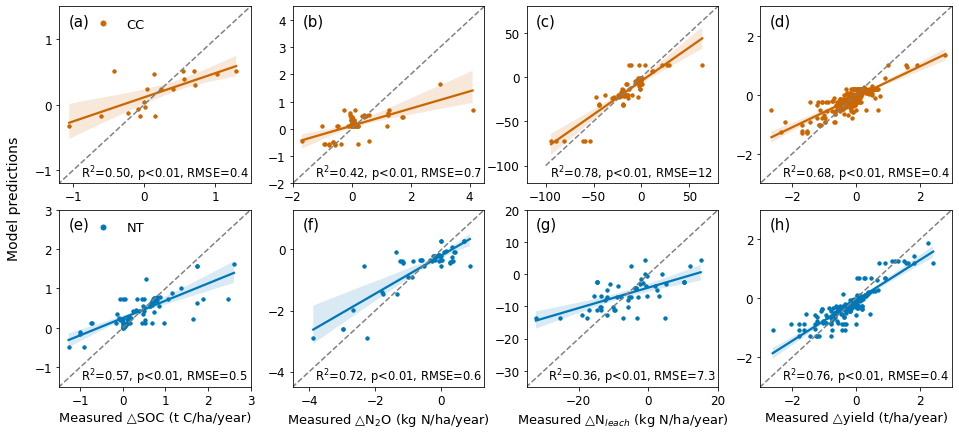

In [46]:
# scatter plot of observation-prediction comparision

def lineargression(obs, sim, ax, no, color):
    mask = ~np.isnan(obs)
    s1, inc1, r1, p1, se1 = stats.linregress(obs[mask], sim[mask])
    # RMSE = sqrt(mean_squared_error(obs, sim))
    MSE = np.square(np.subtract(obs, sim)).mean()
    RMSE = sqrt(MSE)
    corr_linex = [min(obs)*2, max(obs)*2]
    corr_liney = [s1 * min(obs)*2 + inc1, s1 * max(obs)*2 + inc1]
    ax.plot(obs, sim, 'o', color=color, ms=3, markeredgecolor=color)
    # ax.plot(corr_linex, corr_liney, color=color)
    # locs = ax.get_yticks(minor=False)
    # print(locs)
    # ax.set_xticks(locs)
    sns.regplot(obs, sim, ax = ax, ci=95, color=color, scatter_kws={'s':10})
    # ax.plot(corr_linex, corr_linex, c='gray')
    if RMSE > 9.9:
        ax.set_title(r'R$^2$={:.2f}, p<0.01, RMSE={:d}'.format(r1 ** 2, round(RMSE)), x=0.55, y=0, fontsize=11.5)
    elif p1 < 0.01:
        ax.set_title(r'R$^2$={:.2f}, p<0.01, RMSE={:.1f}'.format(r1 ** 2, RMSE), x=0.55, y=0, fontsize=11.5)
    else:
        ax.set_title(r'R$^2$={:.2f}, p={:.2f}, RMSE={}'.format(r1 ** 2, p1, RMSE), x=0.55, y=0, fontsize=11.5)
    plt.text(.05, .96, no, ha='left', va='top', transform=ax.transAxes, fontsize=15)

sim_obs_soc_cc = pd.read_csv(model_outputs_dir + 'CC_delta_SOC_sameinit_30.csv')
sim_obs_soc_nt = pd.read_csv(model_outputs_dir + 'NT_delta_SOC_sameinit_NTeffect_60.csv')
sim_obs_n2o_cc = pd.read_csv(model_outputs_dir + 'CC_delta_N2O.csv')
sim_obs_n2o_nt = pd.read_csv(model_outputs_dir + 'NT_delta_N2O.csv')
sim_obs_lch_cc = pd.read_csv(model_outputs_dir + 'CC_delta_Nleach.csv')
sim_obs_lch_nt = pd.read_csv(model_outputs_dir + 'NT_delta_Nleach.csv')
sim_obs_yld_cc = pd.read_csv(model_outputs_dir + 'CC_delta_yield.csv')
sim_obs_yld_nt = pd.read_csv(model_outputs_dir + 'NT_delta_yield.csv')
cc_soc_obs, cc_soc_sim = sim_obs_soc_cc['obs_delta_SOC_sameinit_30'], sim_obs_soc_cc['prd_delta_SOC_sameinit_30']
cc_n2o_obs, cc_n2o_sim = sim_obs_n2o_cc['obs_delta_N2O'], sim_obs_n2o_cc['prd_delta_N2O']
cc_lch_obs, cc_lch_sim = sim_obs_lch_cc['obs_delta_Nleach'], sim_obs_lch_cc['prd_delta_Nleach']
cc_yld_obs, cc_yld_sim = sim_obs_yld_cc['obs_delta_yield'], sim_obs_yld_cc['prd_delta_yield']
nt_soc_obs, nt_soc_sim = sim_obs_soc_nt['obs_delta_SOC_sameinit_NTeffect_60'], sim_obs_soc_nt['prd_delta_SOC_sameinit_NTeffect_60']
nt_n2o_obs, nt_n2o_sim = sim_obs_n2o_nt['obs_delta_N2O'], sim_obs_n2o_nt['prd_delta_N2O']
nt_lch_obs, nt_lch_sim = sim_obs_lch_nt['obs_delta_Nleach'], sim_obs_lch_nt['prd_delta_Nleach']
nt_yld_obs, nt_yld_sim = sim_obs_yld_nt['obs_delta_yield'], sim_obs_yld_nt['prd_delta_yield']

fig1, axs = plt.subplots(2, 4, figsize=(16, 7), constrained_layout=True)
((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = axs
# ax1.errorbar(n2o_obs, n2o_sim, xerr=n2o_obs_sd, fmt='o')
colors = ['#E64B35FF', '#4DBBD5FF']
colors = ['#E64B35FF', '#00C6CF']
colors = ['#CA6702', '#0077B6']
lineargression(cc_soc_obs, cc_soc_sim, ax1, '(a)', colors[0])
lineargression(cc_n2o_obs, cc_n2o_sim, ax2, '(b)', colors[0])
lineargression(cc_lch_obs, cc_lch_sim, ax3, '(c)', colors[0])
lineargression(cc_yld_obs, cc_yld_sim, ax4, '(d)', colors[0])
lineargression(nt_soc_obs, nt_soc_sim, ax5, '(e)', colors[1])
lineargression(nt_n2o_obs, nt_n2o_sim, ax6, '(f)', colors[1])
lineargression(nt_lch_obs, nt_lch_sim, ax7, '(g)', colors[1])
lineargression(nt_yld_obs, nt_yld_sim, ax8, '(h)', colors[1])


ax1.set_xlabel('')
ax2.set_xlabel('')
ax3.set_xlabel('')
ax4.set_xlabel('')
for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]:
    ax.set_ylabel('')
ax5.set_xlabel('Measured △SOC (t C/ha/year)', size=13)
ax6.set_xlabel(r'Measured △N$_2$O (kg N/ha/year)', size=13)
ax7.set_xlabel(r'Measured △N$_{leach}$ (kg N/ha/year)', size=13)
ax8.set_xlabel('Measured △yield (t/ha/year)', size=13)

plt.subplots_adjust(wspace=0.22, hspace=0.15)

ax1.set_xlim([-1.2, 1.5])
ax1.set_ylim([-1.2, 1.5])
ax1.set_yticks([-1, 0, 1])
ax2.set_xlim([-2, 4.5])
ax2.set_ylim([-2, 4.5])
# ax2.set_xticks(range(-3, 4))
# ax2.set_yticks(range(-3, 4))
ax3.set_xlim([-120, 80])
ax3.set_ylim([-120, 80])
ax4.set_xlim([-3, 3])
ax4.set_ylim([-3, 3])
ax4.set_yticks(range(-2, 4, 2))
ax5.set_xlim([-1.5, 3])
ax5.set_ylim([-1.5, 3])
ax6.set_xlim([-4.5, 1.3])
ax6.set_ylim([-4.5, 1.3])
ax6.set_yticks(range(-4, 2, 2))
ax7.set_xlim([-35, 20])
ax7.set_ylim([-35, 20])
ax8.set_xlim([-3, 3])
ax8.set_ylim([-3, 3])
ax8.set_yticks(range(-2, 4, 2))

for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]:
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.plot(np.arange(-100, 100), np.arange(-100, 100), '--', color='gray')

fig1.text(0.08, 0.5, 'Model predictions', va='center', rotation='vertical', fontsize=14)
ax1.plot(-500, cc_soc_sim[0], 'o', ms = 5, c=colors[0], label = 'CC')
ax5.plot(-500, nt_soc_sim[0], 'o', ms = 5, c=colors[1], label = 'NT')
ax1.legend(loc="upper left", bbox_to_anchor=(0.1,1), frameon=False, fontsize=13)
ax5.legend(loc="upper left", bbox_to_anchor=(0.1,1), frameon=False, fontsize=13)
plt.tight_layout(pad=50, w_pad=50, h_pad=50)
plt.show()

fig1.savefig(plot_dir + 'sim_obs_comparison.png', dpi=300)

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 3.0395102283333335 -0.42550325399999994 1.377149686


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


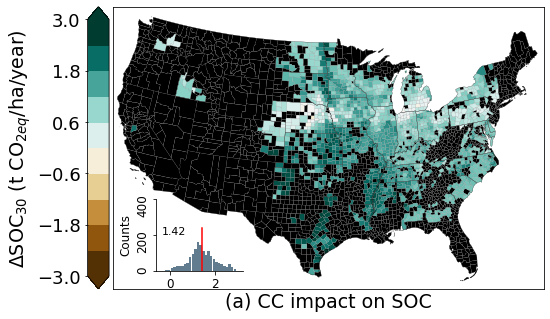

In [28]:
# plot model predictions on delta SOC, N2O, N leaching, and yield per ha
pred_county = pd.read_csv(county_outputs_dir + 'county_pred.csv')
pred_county_se = pd.read_csv(county_outputs_dir + 'county_pred_se.csv')
corn_area = pred_county['corn_area']

def plot_perha(data, prefix='per_ha'):

    cases = ['Rot_delta_SOC_30', 'Con_delta_SOC_30', 'Rot_delta_SOC_60', 'Con_delta_SOC_60', 
             'Rot_delta_N2O_cc', 'Con_delta_N2O_cc', 'Rot_delta_N2O_nt', 'Con_delta_N2O_nt', 
            'Rot_delta_lch_cc', 'Con_delta_lch_cc', 'Rot_delta_lch_nt', 'Con_delta_lch_nt', 
            'Rot_delta_yld_cc', 'Con_delta_yld_cc', 'Rot_delta_yld_nt', 'Con_delta_yld_nt']

    labels = [r'ΔSOC$_{30}$ (t CO$_{2eq}$/ha/year)', r'ΔSOC$_{60}$ (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_{leach}$ (kg N/ha/year)', r'ΔN$_{leach}$ (kg N/ha/year)',
              r'Δyield (t/ha/year)',r'Δyield (t/ha/year)']
    titles = ['(a) CC impact on SOC', '(b) NT impact on SOC',
            r'(c) CC impact on N$_2$O',  r'(d) NT impact on N$_2$O',  
            r'(e) CC impact on N$_{leach}$', r'(f) NT impact on N$_{leach}$',
            r'(g) CC impact on yield', '(h) NT impact on yield']
    xranges = [[-3, 3], [-3, 3], [-0.5, 0.5], [-1.5, 1.5], [-50,50], [-20,20], [-0.5, 0.5], [-1, 1], [-0.5, 0.5], [-1, 1]]
    for i in range(len(cases[:1])):
        case = cases[i]
        label = labels[i//2]
        title = titles[i//2]
        xrange = xranges[i//2]
        pred = data[case]
        if i < 4:
            pred = pred / 12 * 44 # convert C in SOC to CO2 equivelent
        if i // 4 == 1:
            pred = pred *44/28*0.273 # convert N in N2O to CO2 equivelent


        # plot the map
#         cmap = plt.cm.viridis_r
        cmap = plt.cm.BrBG
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_xlabel(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            SOC_mean = pred[pred_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[pred_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((SOC_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(SOC_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        # add a subplot into the plot for histogram
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=30, rwidth=0.95,color='#607c8e')
        mean = np.mean(c_preds)
        subax.axvline(x=mean, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,400])
        # subax.set_xticklabels([-0.25,0,0.25])
        # plt.xlim([-20, 15])
        x_pos = [0.2, 0.2, 2.2, 2.2, 0.15, 0.3, -0.7, -0.9, -30, -30, -11, -8, -0.25, -0.3, 0.5, 0.5]
        x_posi = x_pos[i]
        if case in ['Rot_delta_N2O_nt', 'Con_delta_N2O_nt']:
            x_pos = -1
        if i == 6:
            y_pos = 300
        else:
            y_pos = 200
        subax.text(x_posi, y_pos, '{:.2f}'.format(mean), size=11, ha='center')
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        print('per ha max/min/median:', np.max(c_preds), np.min(c_preds), np.median(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # fig.savefig(plot_path + 'SOC_perha_corn_noNSR_{}.png'.format(case), dpi=300)
        fig.savefig(plot_dir + '{}_{}.png'.format(prefix, case), dpi=300)
        # plt.clf()
plot_perha(pred_county, 'per_ha')

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:36: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 131.927636 0.202343 12.949952


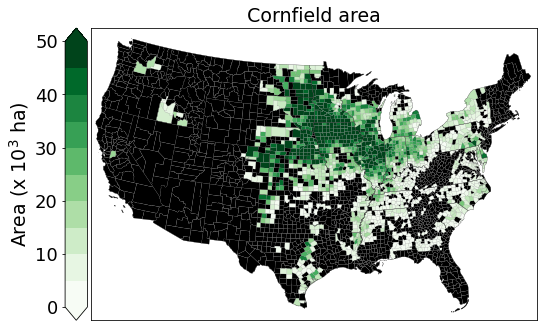

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:36: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: nan nan nan


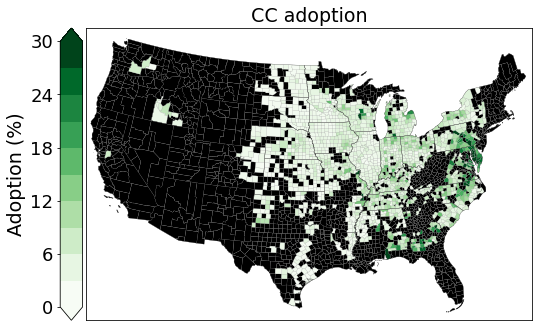

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:36: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: nan nan nan


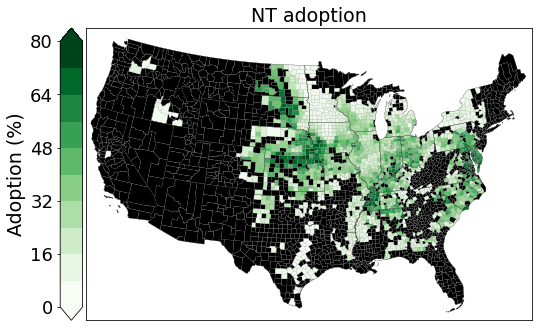

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:36: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 96.1606743 0.0 49.4785812


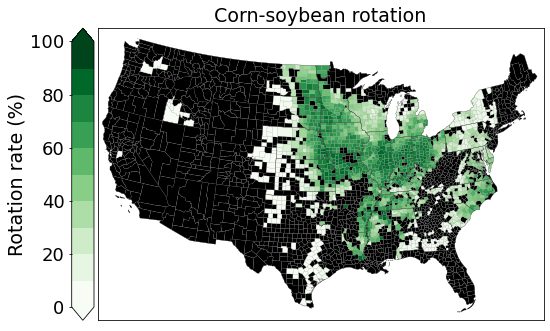

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:36: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: nan nan nan


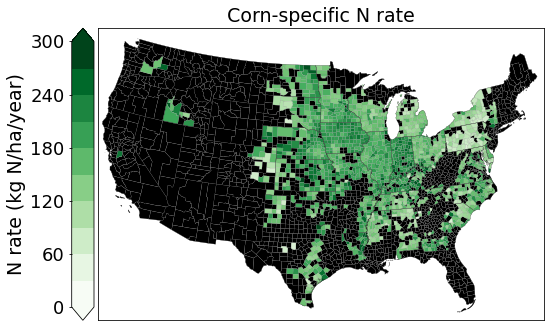

In [85]:
# plot management inforamtion
mag_county = pd.read_csv(model_inputs_dir + 'county_aggregates_2017.csv')

def plot_mangement():

    cases = ['corn_area', 'cc_ratio', 'nt_ratio', 'rot_ratio', 'Nrate']

    labels = [r'Area (x 10$^3$ ha)', r'Adoption (%)', 
              r'Adoption (%)', r'Rotation rate (%)', 
              r'N rate (kg N/ha/year)']
    titles = ['Cornfield area', 'CC adoption',
            r'NT adoption',  r'Corn-soybean rotation',  
            r'Corn-specific N rate']
    xranges = [[0, 50], [0, 30], [0, 80], [0, 100], [0, 300]]
    for i in range(len(cases)):
        case = cases[i]
        label = labels[i]
        title = titles[i]
        xrange = xranges[i]
        pred = mag_county[case]
        if i < 1:
            pred = pred / 1000
        elif i < 4:
            pred = pred * 100

        # plot the map
#         cmap = plt.cm.viridis_r
        cmap = plt.cm.Greens
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_title(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            SOC_mean = pred[mag_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[mag_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((SOC_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(SOC_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        print('per ha max/min/median:', np.max(c_preds), np.min(c_preds), np.median(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()

        fig.savefig(plot_dir + 'mag_{}.png'.format(case), dpi=300)
        # plt.clf()
plot_mangement()

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.5631704646550075 -0.5857751443908784 0.7211326036685544


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


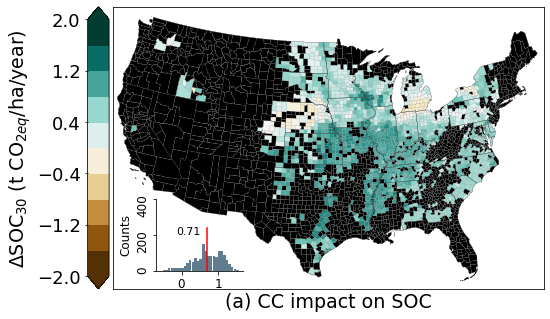

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.5631704646550075 -0.5857751443908784 0.7211326036685544


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


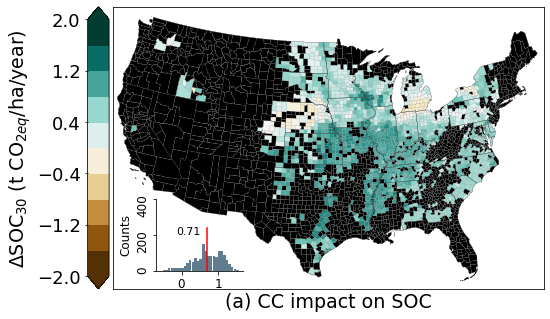

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 3.231171123917994 0.8089814978959623 1.8285961551382517


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


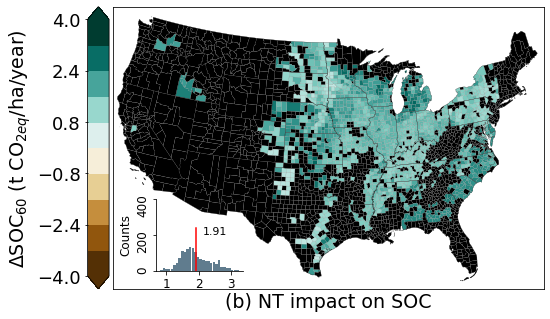

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 3.231171123917994 0.8089814978959623 1.8285961551382517


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


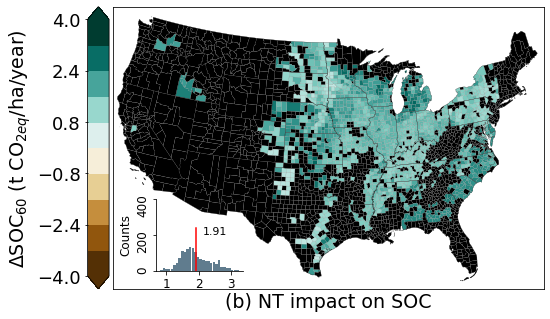

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.21675811569286552 -0.22404666870233197 -0.013198969286784634


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


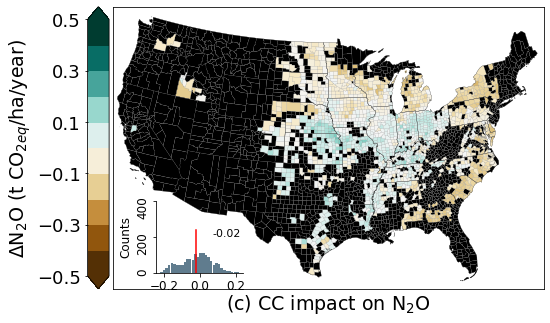

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:46: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:48: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:50: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.21675811569286552 -0.22404666870233197 -0.013198969286784634


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


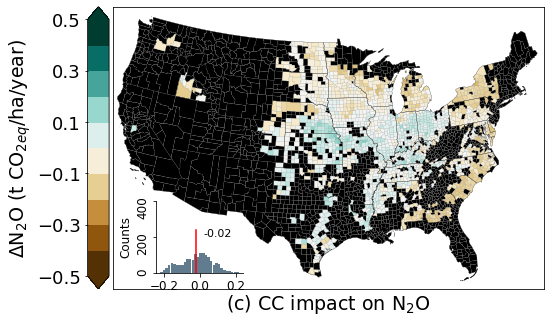

In [50]:
model_inputs_dir = 'D:/carbon credit/metaforest/county_project/inputs/'
model_outputs_dir = 'D:/carbon credit/metaforest/county_project/model_2405_lt/'
county_outputs_dir = 'D:/carbon credit/plot/county_map/cost_benefit/2024/05_lt/'
plot_dir = 'D:/carbon credit/plot/county_map/2024/05_lt/'


# plot model predictions on delta SOC, N2O, N leaching, and yield per ha
pred_county = pd.read_csv(county_outputs_dir + 'county_pred.csv')
pred_county_se = pd.read_csv(county_outputs_dir + 'county_pred_se.csv')
corn_area = pred_county['corn_area']

def plot_perha(data, prefix='per_ha'):

    cases = ['Rot_delta_SOC_30', 'Con_delta_SOC_30', 'Rot_delta_SOC_60', 'Con_delta_SOC_60', 
             'Rot_delta_N2O_cc', 'Con_delta_N2O_cc', 'Rot_delta_N2O_nt', 'Con_delta_N2O_nt', 
            'Rot_delta_lch_cc', 'Con_delta_lch_cc', 'Rot_delta_lch_nt', 'Con_delta_lch_nt', 
            'Rot_delta_yld_cc', 'Con_delta_yld_cc', 'Rot_delta_yld_nt', 'Con_delta_yld_nt']

    labels = [r'ΔSOC$_{30}$ (t CO$_{2eq}$/ha/year)', r'ΔSOC$_{60}$ (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_{leach}$ (kg N/ha/year)', r'ΔN$_{leach}$ (kg N/ha/year)',
              r'Δyield (t/ha/year)',r'Δyield (t/ha/year)']
    titles = ['(a) CC impact on SOC', '(b) NT impact on SOC',
            r'(c) CC impact on N$_2$O',  r'(d) NT impact on N$_2$O',  
            r'(e) CC impact on N$_{leach}$', r'(f) NT impact on N$_{leach}$',
            r'(g) CC impact on yield', '(h) NT impact on yield']
    xranges = [[-2, 2], [-4, 4], [-0.5, 0.5], [-1.5, 1.5], [-50,50], [-20,20], [-0.5, 0.5], [-1, 1], [-0.5, 0.5], [-1, 1]]
    for i in range(len(cases[:6])):
        case = cases[i]
        label = labels[i//2]
        title = titles[i//2]
        xrange = xranges[i//2]
        pred = data[case]
        if i < 4:
            pred = pred / 12 * 44 # convert C in SOC to CO2 equivelent
        if i // 4 == 1:
            pred = pred *44/28*0.273 # convert N in N2O to CO2 equivelent


        # plot the map
#         cmap = plt.cm.viridis_r
        cmap = plt.cm.BrBG
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_xlabel(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            SOC_mean = pred[pred_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[pred_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((SOC_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(SOC_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        # add a subplot into the plot for histogram
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=30, rwidth=0.95,color='#607c8e')
        mean = np.mean(c_preds)
        subax.axvline(x=mean, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,400])
        # subax.set_xticklabels([-0.25,0,0.25])
        # plt.xlim([-20, 15])
        x_pos = [0.2, 0.2, 2.5, 2.5, 0.15, 0.1, -0.7, -0.9, -30, -30, -11, -8, -0.25, -0.3, 0.5, 0.5]
        x_posi = x_pos[i]
        if case in ['Rot_delta_N2O_nt', 'Con_delta_N2O_nt']:
            x_pos = -1
        if i == 6:
            y_pos = 300
        else:
            y_pos = 200
        subax.text(x_posi, y_pos, '{:.2f}'.format(mean), size=11, ha='center')
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        print('per ha max/min/median:', np.max(c_preds), np.min(c_preds), np.median(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # fig.savefig(plot_path + 'SOC_perha_corn_noNSR_{}.png'.format(case), dpi=300)
        fig.savefig(plot_dir + '{}_{}.png'.format(prefix, case), dpi=300)
        # plt.clf()
plot_perha(pred_county, 'per_ha')

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:31: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:33: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.4659693361956073 -0.5801703930416391 -0.06468859901135539


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


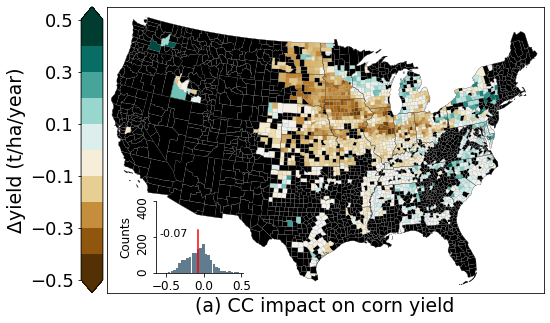

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:31: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:33: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.4160729855775666 -0.2599503580515866 -0.021612550207389666


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


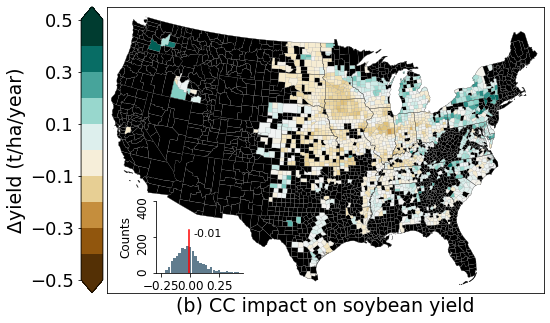

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:31: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:33: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.2952017794398167 -1.0267519402470755 -0.2718955285544723


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


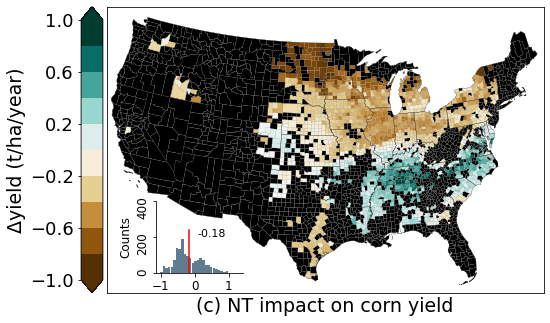

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:31: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:33: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.1044854517939215 -0.4432413658153911 -0.06593400121155407


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


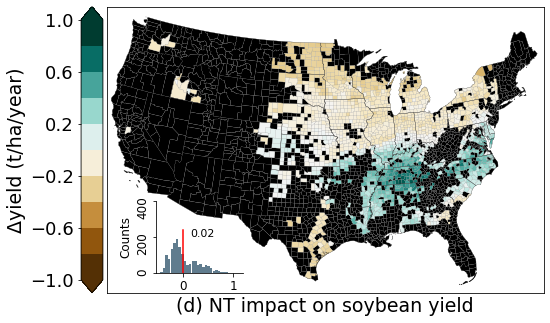

In [51]:
# plot model predictions yield for corn and soybean per ha
pred_county = pd.read_csv(county_outputs_dir + 'county_pred.csv')
pred_county_se = pd.read_csv(county_outputs_dir + 'county_pred_se.csv')
corn_area = pred_county['corn_area']

def plot_perha(data, prefix='per_ha'):

    cases = [
            'Rot_delta_yld_cc_corn', 'Rot_delta_yld_cc_soy', 'Rot_delta_yld_nt_corn', 'Rot_delta_yld_nt_soy']

    labels = [
              r'Δyield (t/ha/year)',r'Δyield (t/ha/year)',r'Δyield (t/ha/year)',r'Δyield (t/ha/year)']
    titles = [r'(a) CC impact on corn yield', r'(b) CC impact on soybean yield', 
              '(c) NT impact on corn yield', '(d) NT impact on soybean yield']
    xranges = [[-0.5, 0.5], [-1, 1]]
    for i in range(len(cases)):
        case = cases[i]
        label = labels[i//2]
        title = titles[i]
        xrange = xranges[i//2]
        pred = data[case]

        # plot the map
#         cmap = plt.cm.viridis_r
        cmap = plt.cm.BrBG
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_xlabel(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            SOC_mean = pred[pred_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[pred_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((SOC_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(SOC_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        # add a subplot into the plot for histogram
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=30, rwidth=0.95,color='#607c8e')
        mean = np.mean(c_preds)
        subax.axvline(x=mean, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,400])
        # subax.set_xticklabels([-0.25,0,0.25])
        # plt.xlim([-20, 15])
        x_pos = [-0.4, 0.15, 0.5, 0.4]
        x_posi = x_pos[i]
        if case in ['Rot_delta_N2O_nt', 'Con_delta_N2O_nt']:
            x_pos = -1
        subax.text(x_posi, 200, '{:.2f}'.format(mean), size=11, ha='center')
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        print('per ha max/min/median:', np.max(c_preds), np.min(c_preds), np.median(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # fig.savefig(plot_path + 'SOC_perha_corn_noNSR_{}.png'.format(case), dpi=300)
        fig.savefig(plot_dir + '{}_{}.png'.format(prefix, case), dpi=300)
        # plt.clf()
plot_perha(pred_county, 'per_ha')

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.9949304727825984 0.19681968407816106 0.37904671605082213


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


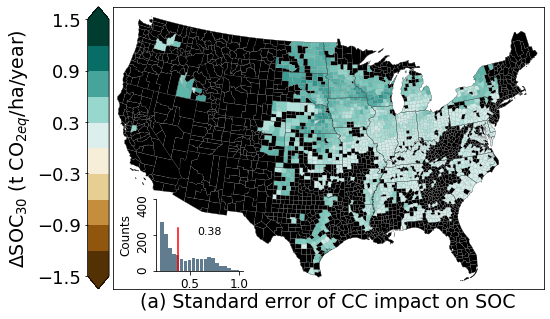

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.0022039898253632 0.2045575277473085 0.43407537917341127


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


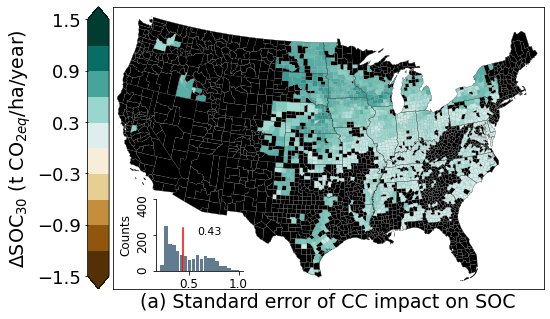

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.0016349757469356 0.2879966049473738 0.4219184888342694


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


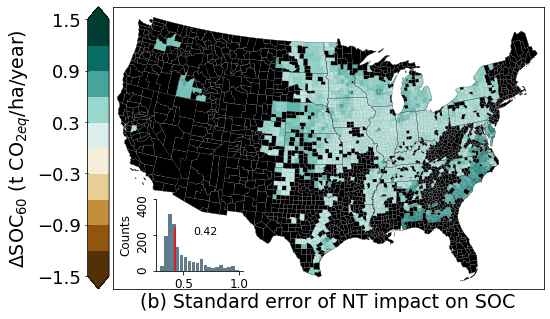

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 1.0043531794321414 0.11142196460764109 0.20095709717806756


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


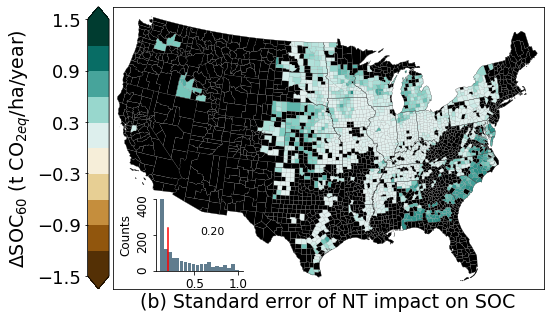

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.2793500045524362 0.05754067127232849 0.10036385988621595


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


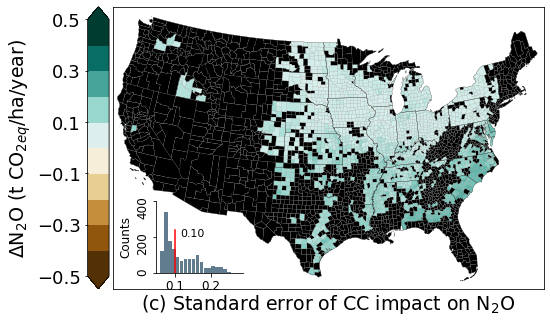

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.27945937506267116 0.05521973721659232 0.10004967515540816


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


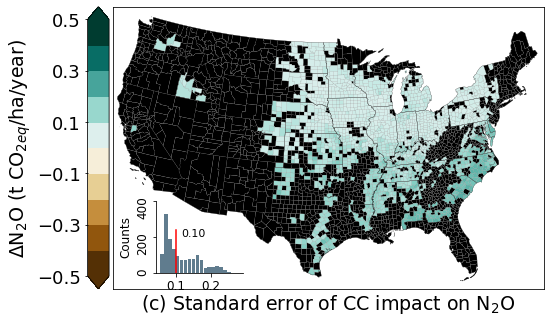

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.3122401809536804 0.07468259307462288 0.152926187205532


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


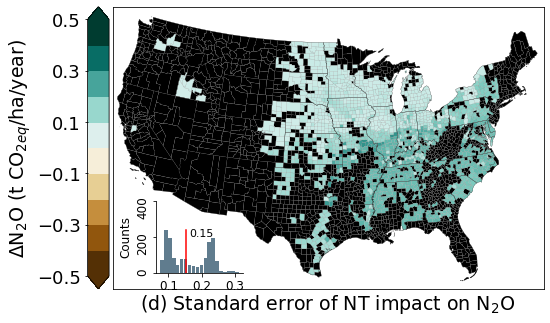

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.24625034894457723 0.15099228627125857 0.16751411310482955


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


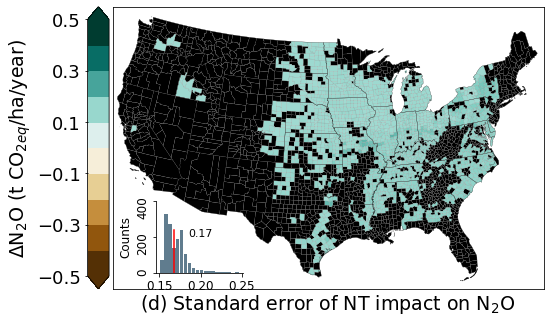

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 8.6251965998993 3.5239861586059433 3.5511541630935404


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


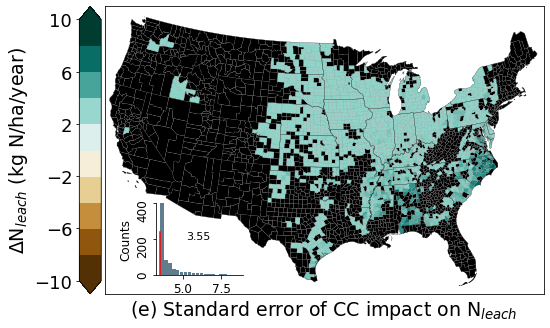

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 8.629878565420485 3.481103952341265 3.509023059000693


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


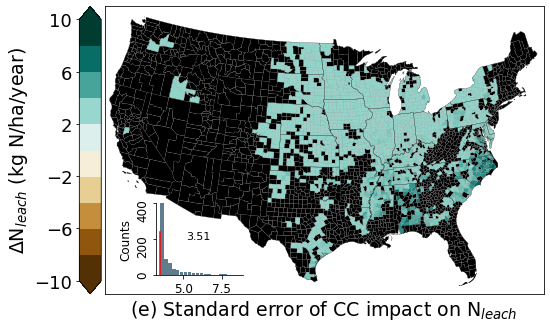

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 6.275917007666596 1.5677211927848198 2.576697650100259


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


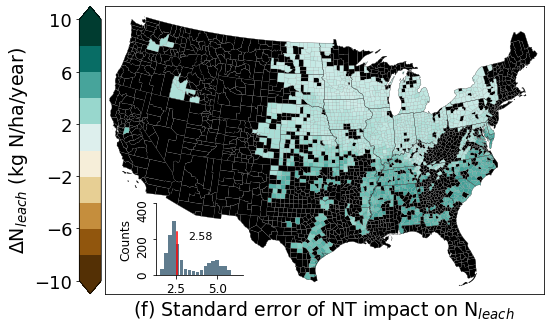

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 6.895193171134937 2.1395933423751 3.7415464147481714


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


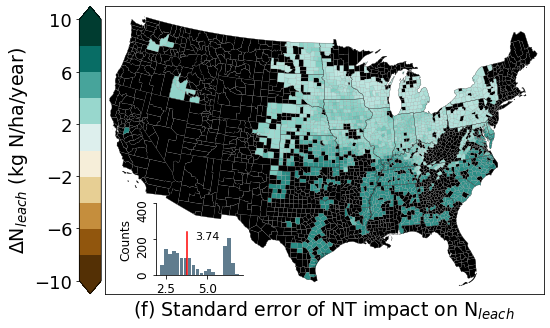

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.3689862755229741 0.03170288759293035 0.04281396475984056


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


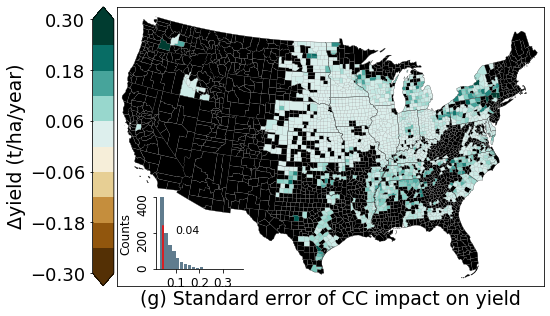

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.39811198311013424 0.034167348104655444 0.045497828080583


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


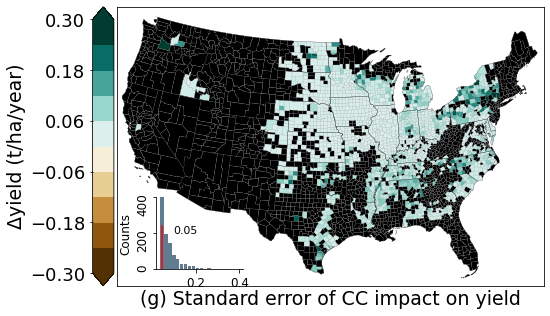

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.25968078059372485 0.03770571543644369 0.04493341960318696


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


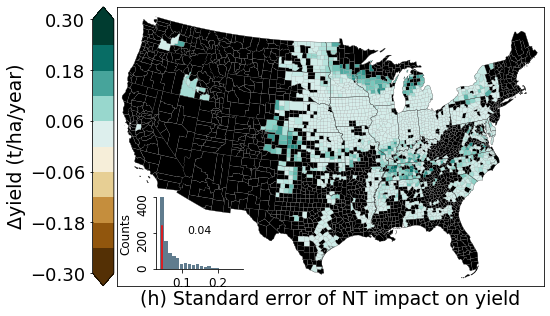

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:40: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:44: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/median: 0.27286112109131905 0.03425073062729487 0.042615851105918694


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


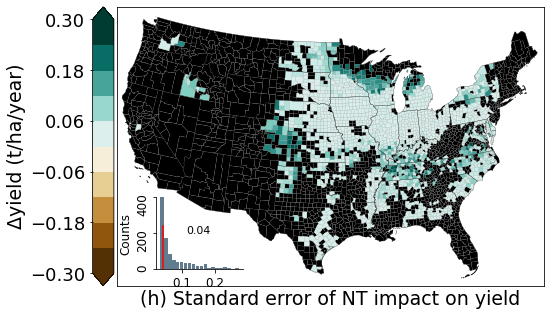

In [107]:
# plot model prediction SE on delta SOC, N2O, N leaching, and yield
pred_county = pd.read_csv(county_outputs_dir + 'county_pred.csv')
pred_county_se = pd.read_csv(county_outputs_dir + 'county_pred_se.csv')
corn_area = pred_county['corn_area']

def plot_perha(data, prefix='per_ha'):

    cases = ['Rot_delta_SOC_30', 'Con_delta_SOC_30', 'Rot_delta_SOC_60', 'Con_delta_SOC_60', 
             'Rot_delta_N2O_cc', 'Con_delta_N2O_cc', 'Rot_delta_N2O_nt', 'Con_delta_N2O_nt', 
            'Rot_delta_lch_cc', 'Con_delta_lch_cc', 'Rot_delta_lch_nt', 'Con_delta_lch_nt', 
            'Rot_delta_yld_cc', 'Con_delta_yld_cc', 'Rot_delta_yld_nt', 'Con_delta_yld_nt']

    labels = [r'ΔSOC$_{30}$ (t CO$_{2eq}$/ha/year)', r'ΔSOC$_{60}$ (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', r'ΔN$_2$O (t CO$_{2eq}$/ha/year)', 
              r'ΔN$_{leach}$ (kg N/ha/year)', r'ΔN$_{leach}$ (kg N/ha/year)',
              r'Δyield (t/ha/year)',r'Δyield (t/ha/year)']
    titles = ['(a) Standard error of CC impact on SOC', '(b) Standard error of NT impact on SOC',
            r'(c) Standard error of CC impact on N$_2$O',  r'(d) Standard error of NT impact on N$_2$O',  
            r'(e) Standard error of CC impact on N$_{leach}$', r'(f) Standard error of NT impact on N$_{leach}$',
            r'(g) Standard error of CC impact on yield', '(h) Standard error of NT impact on yield']
    xranges = [[-1.5, 1.5], [-1.5, 1.5], [-0.5, 0.5], [-0.5, 0.5], [-10,10], [-10,10], [-0.3, 0.3], [-0.3, 0.3]]
    for i in range(len(cases)):
        case = cases[i]
        label = labels[i//2]
        title = titles[i//2]
        xrange = xranges[i//2]
        pred = data[case]
        if i < 4:
            pred = pred / 12 * 44 # convert C in SOC to CO2 equivelent
        if i // 4 == 1:
            pred = pred *44/28*0.273 # convert N in N2O to CO2 equivelent


        # plot the map
#         cmap = plt.cm.viridis_r
        cmap = plt.cm.BrBG
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_xlabel(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            var_mean = pred[pred_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[pred_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((var_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(var_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        # add a subplot into the plot for histogram
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=20, rwidth=0.9,color='#607c8e')
        median = np.median(c_preds)
        subax.axvline(x=median, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,400])
        # subax.set_xticklabels([-0.25,0,0.25])
        # plt.xlim([-20, 15])
        x_pos = [0.7, 0.7, 0.7, 0.7, 0.15, 0.15, 0.2, 0.2, 6, 6, 4, 5, 0.15, 0.15, 0.15, 0.15]
        x_posi = x_pos[i]
        subax.text(x_posi, 200, '{:.2f}'.format(median), size=11, ha='center')
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        print('per ha max/min/median:', np.max(c_preds), np.min(c_preds), np.median(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # fig.savefig(plot_path + 'SOC_perha_corn_noNSR_{}.png'.format(case), dpi=300)
        fig.savefig(plot_dir + '{}_{}.png'.format(prefix, case), dpi=300)
        # plt.clf()
plot_perha(pred_county_se, 'per_ha_se')

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 9.828072008007023 -2.5087561850974085 0.2702700301130352


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


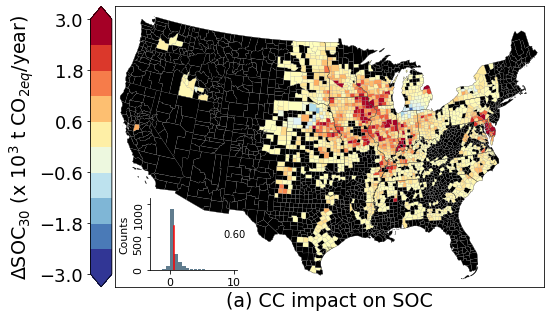

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 179.04955434504978 0.004499616440206321 5.790718928093616


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


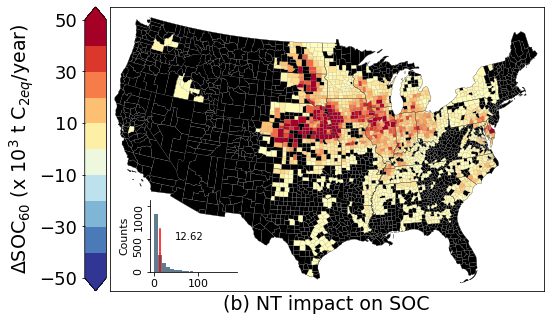

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 0.7417816487171138 -1.943972978658016 -0.0012770779112011514


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


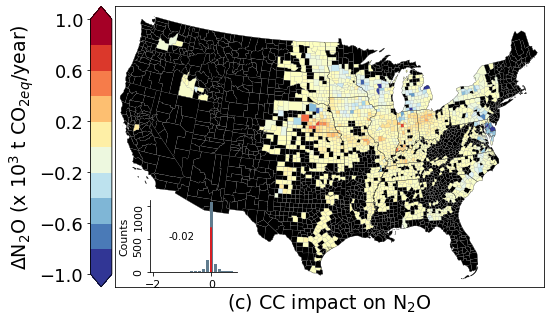

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: -0.0005482874465075745 -35.30721830852116 -1.3807906536364567


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


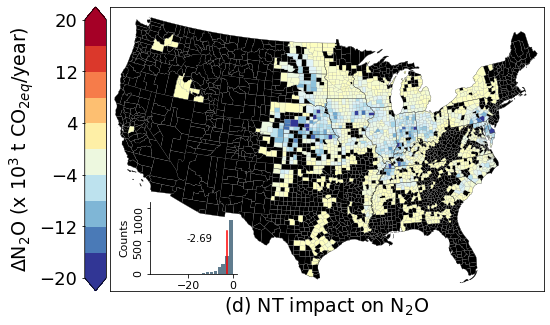

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 6.342155385247388 -292.40743741743995 -3.0548097699678713


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


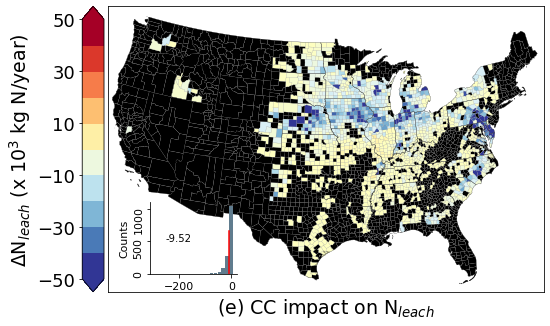

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: -0.00346016433365379 -495.16428583982116 -18.335367257237046


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


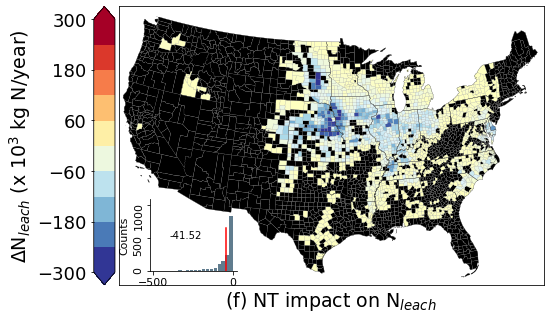

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 1.943567714918723 -2.028657799929155 -0.012915135638019375


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


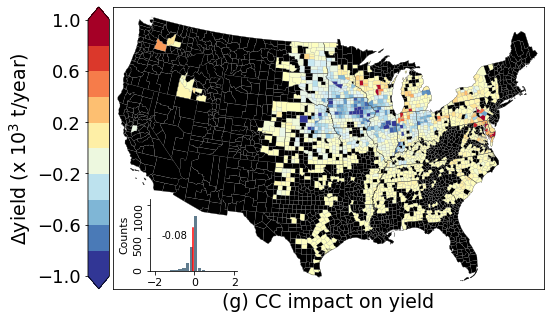

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:45: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


per ha max/min/mean: 9.726386075379903 -33.464338901796545 -0.269995984587217


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


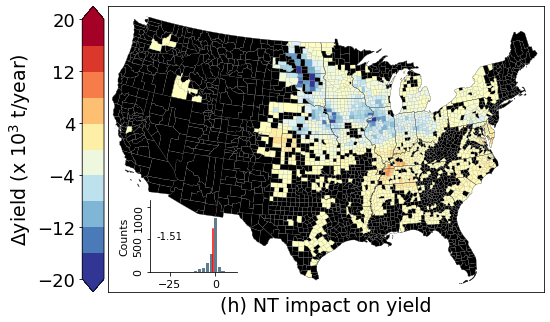

In [55]:
# plot preidcited delta SOC, N2O, N leaching, and yield per ha
sum_county = pd.read_csv(county_outputs_dir + 'county_aggregates_2017.csv')
corn_area = sum_county['corn_area']

def plot_aggregate():

    cases = ['sum_cc_soc', 'sum_nt_soc', 'sum_cc_n2o','sum_nt_n2o',
             'sum_cc_lch','sum_nt_lch','sum_cc_yld','sum_nt_yld']
#             'sum_soc_cc_rot', 'sum_soc_cc_con', 'sum_soc_nt_rot', 'sum_soc_nt_con',
#             'sum_n2o_cc_rot','sum_n2o_cc_con','sum_n2o_nt_rot','sum_n2o_nt_con',
#             'sum_lch_cc_rot','sum_lch_cc_con','sum_lch_nt_rot','sum_lch_nt_con',
#             'sum_yld_cc_rot','sum_yld_cc_con','sum_yld_nt_rot','sum_yld_nt_rot'

    labels = [r'ΔSOC$_{30}$ (x 10$^3$ t CO$_{2eq}$/year)', r'ΔSOC$_{60}$ (x 10$^3$ t C$_{2eq}$/year)', 
              r'ΔN$_2$O (x 10$^3$ t CO$_{2eq}$/year)', r'ΔN$_2$O (x 10$^3$ t CO$_{2eq}$/year)',
              r'ΔN$_{leach}$ (x 10$^3$ kg N/year)', r'ΔN$_{leach}$ (x 10$^3$ kg N/year)',
              r'Δyield (x 10$^3$ t/year)', r'Δyield (x 10$^3$ t/year)']
    titles = ['(a) CC impact on SOC', '(b) NT impact on SOC',
            r'(c) CC impact on N$_2$O',  r'(d) NT impact on N$_2$O',  
            r'(e) CC impact on N$_{leach}$', r'(f) NT impact on N$_{leach}$',
            r'(g) CC impact on yield', '(h) NT impact on yield']
    xranges = [[-3, 3], [-50, 50], [-1, 1], [-20, 20], [-50, 50], [-300, 300], [-1, 1], [-20, 20]]
    scale = 1000
    for i in range(len(cases)):
        case = cases[i]
        label = labels[i]
        title = titles[i]
        xrange = xranges[i]
        pred = sum_county[case] / scale
        if i < 2:
            pred = pred / 12 * 44 # convert C in SOC to CO2 equivelent
        if i // 2 == 1:
            pred = pred *44/28*0.273 # convert N in N2O to CO2 equivelent


        # plot the map
        cmap = plt.cm.RdYlBu_r
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        ax.set_xlabel(title, size=19)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds = []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            var_mean = pred[sum_county['FIPS'] == fips].reset_index(drop=True)
            # plot predicted SOC per ha
            corn_area_i = corn_area[sum_county['FIPS'] == fips].reset_index(drop=True)
            if corn_area_i.size > 0:
                if corn_area_i.iloc[0] > 0:
                    c = cmap((var_mean.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(var_mean.iloc[0])
                else:
                    polygon = Polygon(shape, facecolor='k', edgecolor='none')
                    ax.add_patch(polygon)

        # add a subplot into the plot for histogram
        subax = fig.add_axes([0.28, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=20, rwidth=0.9,color='#607c8e')
        median = np.nanmean(c_preds)
        subax.axvline(x=median, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=11)
        subax.set_ylim([0,1100])
        # subax.set_xticklabels([-0.25,0,0.25])
        # plt.xlim([-20, 15])
#         x_pos = [3, 10, 50, 50, 2, 2, -20, -20, -100, -300, -300, -150, -2, -2, -25, -25]
        x_pos = [10, 80, -1, -15, -200, -300, -1, -25]
        x_posi = x_pos[i]
        subax.text(x_posi, 500, '{:.2f}'.format(median), size=10, ha='center')
        subax.tick_params(axis='both', which='major', labelsize=11)
        subax.tick_params(axis='y', which='major', rotation=90)


        print('per ha max/min/mean:', np.nanmax(c_preds), np.nanmin(c_preds), np.nanmedian(c_preds))
        # print('county total max/min:', max(c_preds), min(c_preds)
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # fig.savefig(plot_path + 'SOC_perha_corn_noNSR_{}.png'.format(case), dpi=300)
        fig.savefig(plot_dir + 'aggregate_{}.png'.format(case), dpi=300)
        # plt.clf()
plot_aggregate()

911 3108
1442 3108
804 1474
813 1466
855
116
1386


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:62: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


1494
county total max/min/med: 1.6369447538217738 -0.4085910370014448 0.8357385365958387
56 1479 1479


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:120: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


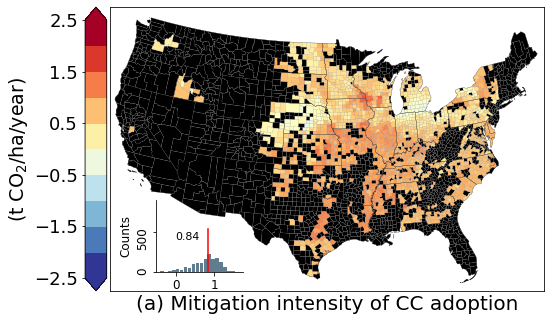

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:58: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:60: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


KeyboardInterrupt: 

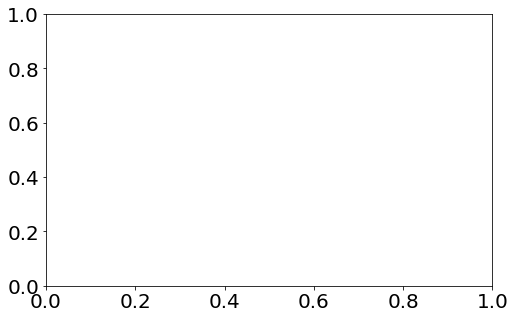

In [58]:
# plot GHG mitigation intensity and effociency at county level
def plot_mitigation_map():

    data = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017.csv', index_col=0)
    data = data.replace(0, np.nan)

    print(len(data['cc_eff'][data['cc_eff'] > -100]), len(data['cc_eff']))
    print(len(data['nt_eff'][data['nt_eff'] > -50]), len(data['nt_eff']))
    print(len(data['nt_eff'][data['NT_SB'] > 0]), len(data['nt_eff'].dropna()))
    print(len(data['cc_eff'][data['CC_SB'] > 0]), len(data['cc_eff'].dropna()))
    cols = ['cc_int', 'nt_int', 'cc_cost', 'nt_cost', 'cc_eff', 'nt_eff']

    CC_co2_int = data[cols[0]]
    NT_co2_int = data[cols[1]]
    CC_cost = - data[cols[2]]
    NT_cost = - data[cols[3]]
    CC_co2_eff = - data[cols[4]]
    NT_co2_eff = - data[cols[5]]
    
    # set cost effeiciency as 0 where mitigation intensity is <= 0
    # set 500 as a cap for effeiciency values (effeiciency is very large when intensity gets close to 0)
    CC_co2_eff[CC_co2_int < 0] = 0
    NT_co2_eff[NT_co2_int < 0] = 0
    CC_co2_eff[CC_co2_eff < -500] = -500
    CC_co2_eff[CC_co2_eff > 500] = 500
    NT_co2_eff[NT_co2_eff < -500] = -500
    NT_co2_eff[NT_co2_eff > 500] = 500
    print(len(CC_co2_eff[(CC_co2_eff < 100) & (CC_co2_eff != 0)]))
    print(len(CC_co2_eff[(CC_co2_eff < 50) & (CC_co2_eff != 0)]))
    print(len(NT_co2_eff[(NT_co2_eff < 50) & (CC_co2_eff != 0)]))

    preds = [CC_co2_int, NT_co2_int, CC_cost, NT_cost, CC_co2_eff, NT_co2_eff]
    labels = [r'(t CO$_2$/ha/year)', r'(t CO$_2$/ha/year)', r'(\$/ha/year)', r'(\$/ha/year)', 
              r'(\$ /t CO$_2$)', r'(\$ /t CO$_2$)', 
              '(million $/year)', '(million $/year)', '(million $/year)', '(million $/year)']
    names = ['co2_intensity_CC', 'co2_intensity_NT', 'onfarm_cost_CC', 'onfarm_cost_NT', 
             'co2_efficiency_CC', 'co2_efficiency_NT', 'map_mrg1_CC', 'map_mrg1_NT', 'map_mrg2_CC', 'map_mrg2_NT']
    titles = [r'(a) Mitigation intensity of CC adoption', r'(b) Mitigation intensity of NT adoption', 
              r'(c) On-farm costs of CC adoption', r'(d) On-farm costs of NT adoption', 
              r'(e) Mitigation cost of CC adoption', r'(f) Mitigation cost of NT adoption',
              r'(e) Margin$_{out}$ of CC adoption', r'(f) Margin$_{out}$ of NT adoption', 
              r'(g) Margin$_{in+out}$ of CC adoption', r'(h) Margin$_{in+out}$ of NT adoption']
    xranges = [[-2.5,2.5], [-5,5], [-200,200], [-200,200], [-200,200], [-150,150]]
    
    for i in range(len(preds[:6])):
        label = labels[i]
        pred = preds[i]
        name = names[i]
        title = titles[i]
        xrange = xranges[i]
        scale = 1

        
        cmap = plt.cm.RdYlBu_r
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        # plt.text(160000, 100000, title, size=18)
        ax.set_xlabel(title, size=20)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds, soil_mapu_count, STATE, COUNTY = [], [], [], []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            # map_count = pd.Series(np.sort(np.load(soil_count_dir + 'count_{}.npy'.format(fips)))[::-1][:5])
            # pred_mean = (pred[preds_SOC['FIPS'] == fips].reset_index(drop=True) * map_count).sum() / map_count.sum()
            pred_i = pred[data['FIPS'] == fips].reset_index(drop=True)

            # plot predicted margin per county
            corn_area_i = corn_area[sum_county['FIPS'] == fips].reset_index(drop=True).dropna()
            if corn_area_i.size > 0:
                    c = cmap((pred_i.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(pred_i.iloc[0])
            else:
                polygon = Polygon(shape, facecolor='k', edgecolor='none')
                ax.add_patch(polygon)

        # # add a subplot into the plot for histogram
        print(len(c_preds))
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=20, rwidth=0.9,color='#607c8e')
        med = np.nanmedian(c_preds)
        subax.axvline(x=med, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,900])
        x_pos = [0, 2.8, 0, -150, 200, -100]
        x_posi = x_pos[i]
        subax.text(x_posi, 400, '{:.2f}'.format(med), size=11)
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        # print('per ha max/min:', pred.max(), pred.min(), pred.mean(0))
        print('county total max/min/med:', max(c_preds), min(c_preds), np.nanmedian(c_preds))
        print(len(np.array(c_preds)[np.array(c_preds) < 0]), len(np.array(c_preds)[np.array(c_preds) < 50]), len(np.array(c_preds)[np.array(c_preds) < 100]))
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        # cbar.ax.set_title('{}'.formt(name))
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # soil_mapunip_csv = pd.DataFrame({'soilmap_ratio':soil_mapunip_ratio, 'state': State, 'county': County}).sort_values(by=['state', 'county'])
        # soil_mapunip_csv.to_csv('./county_soil_mapunit_ratio.csv')
        fig.savefig(plot_dir + '/map_{}.png'.format(name), dpi=300)

plot_mitigation_map()

In [5]:
data = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017.csv', index_col=0)
data = data.replace(0, np.nan)
cols = ['cc_int', 'nt_int', 'cc_cost', 'nt_cost', 'cc_eff', 'nt_eff']

CC_co2_int = data[cols[0]]
NT_co2_int = data[cols[1]]
CC_cost = - data[cols[2]]
NT_cost = - data[cols[3]]
CC_co2_eff = - data[cols[4]]
NT_co2_eff = - data[cols[5]]
CC_co2_eff[CC_co2_int < 0] = np.nan
NT_co2_eff[NT_co2_int < 0] = np.nan

# print(len(sum_county['corn_area'].dropna()))

print(len(CC_co2_eff[CC_co2_eff < 100]), len(CC_co2_eff[CC_co2_eff < 100])/1481)
print(len(CC_co2_eff[CC_co2_eff < 50]), len(CC_co2_eff[CC_co2_eff < 50])/1481)
print(len(NT_co2_eff[NT_co2_eff < 50]), len(NT_co2_eff[NT_co2_eff < 50])/1481)
print(len(data['nt_eff'][data['NT_FC'] > 0]), len(data['nt_eff'].dropna()), len(data['nt_eff'][data['NT_FC'] > 0])/1481)
print(len(data['cc_eff'][data['CC_FC'] > 0]), len(data['cc_eff'].dropna()), len(data['cc_eff'][data['CC_FC'] > 0])/1481)

855 0.5773126266036462
116 0.07832545577312626
1442 0.9736664415935179
695 1474 0.46927751519243754
5 1466 0.00337609723160027


1466 3108
1474 3108
1474 1474


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:57: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:59: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


1494
county total max/min/med: 1.092835958872225 0.3003100033091685 0.5406515584383282
0 1479 1479


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


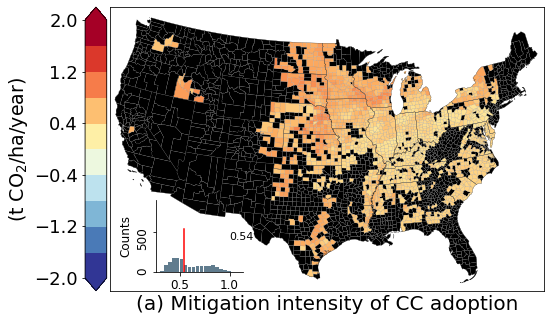

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:57: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:59: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


1494
county total max/min/med: 1.1953155655295775 0.2974915150072245 0.526679061873213
0 1487 1487


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


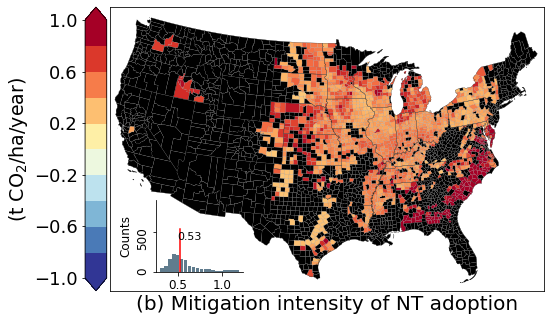

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:57: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:59: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


1494
county total max/min/med: 61.99839599844695 4.930133692363508 8.211842948203909
0 1475 1479


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


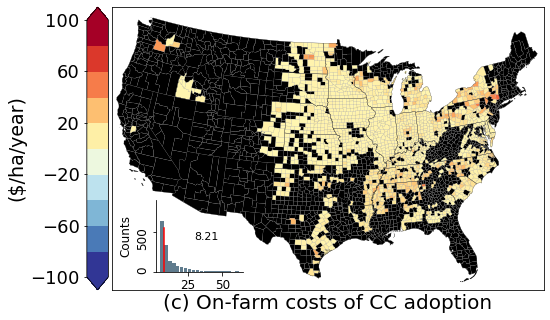

D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:57: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:59: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:61: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


1494
county total max/min/med: 52.57475675939671 5.042711277882583 9.312459978133326
0 1486 1487


D:\workingProgramProfile\Anaconda\envs\py-basemap\lib\site-packages\ipykernel_launcher.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


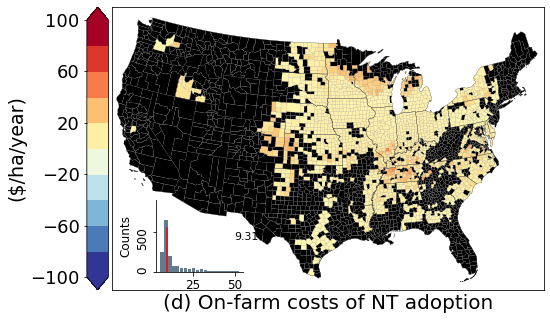

In [7]:
sum_county = pd.read_csv(county_outputs_dir + 'county_aggregates_2017.csv')
corn_area = sum_county['corn_area']


# plot GHG mitigation intensity and effociency at county level
def plot_mitigation_map_se():
    data = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017_se.csv', index_col=0)
    data = data.replace(0, np.nan)
    
    print(len(data['cc_eff'][data['cc_eff'] > -100]), len(data['cc_eff']))
    print(len(data['nt_eff'][data['nt_eff'] > -50]), len(data['nt_eff']))
    print(len(data['nt_eff'][data['NT_SB'] > 0]), len(data['nt_eff'].dropna()))
    cols = ['cc_int', 'nt_int', 'cc_cost', 'nt_cost', 'cc_eff', 'nt_eff']

    CC_co2_int = data[cols[0]]
    NT_co2_int = data[cols[1]]
    CC_cost = data[cols[2]]
    NT_cost = data[cols[3]]
    CC_co2_eff = - data[cols[4]]
    NT_co2_eff = - data[cols[5]]

    # set cost effeiciency as 0 where mitigation intensity is <= 0
    # set 500 as a cap for effeiciency values (effeiciency is very large when intensity gets close to 0)
    CC_co2_eff[CC_co2_int < 0] = 0
    NT_co2_eff[NT_co2_int < 0] = 0
    CC_co2_eff[CC_co2_eff < -500] = -500
    CC_co2_eff[CC_co2_eff > 500] = 500
    NT_co2_eff[NT_co2_eff < -500] = -500
    NT_co2_eff[NT_co2_eff > 500] = 500

    preds = [CC_co2_int, NT_co2_int, CC_cost, NT_cost]
    labels = [r'(t CO$_2$/ha/year)', r'(t CO$_2$/ha/year)', r'(\$/ha/year)', r'(\$/ha/year)', 
              r'(\$ /t CO$_2$)', r'(\$ /t CO$_2$)', 
              '(million $/year)', '(million $/year)', '(million $/year)', '(million $/year)']
    names = ['co2_intensity_CC', 'co2_intensity_NT', 'onfarm_cost_CC', 'onfarm_cost_NT', 
             'co2_efficiency_CC', 'co2_efficiency_NT', 'map_mrg1_CC', 'map_mrg1_NT', 'map_mrg2_CC', 'map_mrg2_NT']
    titles = [r'(a) Mitigation intensity of CC adoption', r'(b) Mitigation intensity of NT adoption', 
              r'(c) On-farm costs of CC adoption', r'(d) On-farm costs of NT adoption', 
              r'(e) Mitigation cost of CC adoption', r'(f) Mitigation cost of NT adoption',
              r'(e) Margin$_{out}$ of CC adoption', r'(f) Margin$_{out}$ of NT adoption', 
              r'(g) Margin$_{in+out}$ of CC adoption', r'(h) Margin$_{in+out}$ of NT adoption']
    xranges = [[-2,2], [-1,1], [-100,100], [-100,100], [-150,150], [-150,150]]
    
    for i in range(len(preds)):
        label = labels[i]
        pred = preds[i]
        name = names[i]
        title = titles[i]
        xrange = xranges[i]
        scale = 1

        
        cmap = plt.cm.RdYlBu_r
        vmin, vmax = xrange[0], xrange[1]

        fig, ax = plt.subplots(figsize=(8, 5))
        map = Basemap(lat_0=40, lon_0=-90, llcrnrlon=-119, llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, epsg=5070)
        map.readshapefile('C:/Users/yyf/Desktop/Ecosys materials/N2O_data/site_map/scripts/shapefile/st99_d00', 'States',
                          drawbounds=True, color='k', linewidth=0.2)
        map.readshapefile('D:/USmap_GIS/cb_2018_us_county_20m/cb_2018_us_county_20m', 'Counties', drawbounds=True,
                          color='gray', linewidth=0.1)
        # plt.text(160000, 100000, title, size=18)
        ax.set_xlabel(title, size=20)
        # a = pd.DataFrame(map.Counties_info)['GEOID'].sort_values()
        c_preds, soil_mapu_count, STATE, COUNTY = [], [], [], []
        for (info, shape) in zip(map.Counties_info, map.Counties):
            state = int(info['STATEFP'])
            fips = int(info['GEOID'])
            # map_count = pd.Series(np.sort(np.load(soil_count_dir + 'count_{}.npy'.format(fips)))[::-1][:5])
            # pred_mean = (pred[preds_SOC['FIPS'] == fips].reset_index(drop=True) * map_count).sum() / map_count.sum()
            pred_i = pred[data['FIPS'] == fips].reset_index(drop=True)

            # plot predicted margin per county
            corn_area_i = corn_area[sum_county['FIPS'] == fips].reset_index(drop=True).dropna()
            if corn_area_i.size > 0:
                    c = cmap((pred_i.iloc[0] - vmin) / (vmax - vmin))[:3]
                    polygon = Polygon(shape, facecolor=c, edgecolor='none')
                    ax.add_patch(polygon)
                    c_preds.append(pred_i.iloc[0])
            else:
                polygon = Polygon(shape, facecolor='k', edgecolor='none')
                ax.add_patch(polygon)

        # # add a subplot into the plot for histogram
        print(len(c_preds))
        subax = fig.add_axes([0.29, 0.19, 0.15, 0.2])
        subax.patch.set_alpha(0.01)
        subax.spines['top'].set(visible=False)
        subax.spines['right'].set(visible=False)
        n, bins, patches = subax.hist(x=c_preds, bins=20, rwidth=0.9,color='#607c8e')
        med = np.nanmedian(c_preds)
        subax.axvline(x=med, ymin=0, ymax=0.6, color='r')
        subax.set_ylabel('Counts', size=12)
        subax.set_ylim([0,900])
        x_pos = [1, 0.5, 30, 50]
        x_posi = x_pos[i]
        subax.text(x_posi, 400, '{:.2f}'.format(med), size=11)
        subax.tick_params(axis='both', which='major', labelsize=12)
        subax.tick_params(axis='y', which='major', rotation=90)


        # print('per ha max/min:', pred.max(), pred.min(), pred.mean(0))
        print('county total max/min/med:', np.nanmax(c_preds), np.nanmin(c_preds), med)
        print(len(np.array(c_preds)[np.array(c_preds) < 0]), len(np.array(c_preds)[np.array(c_preds) < 50]), len(np.array(c_preds)[np.array(c_preds) < 100]))
        bounds = np.linspace(vmin, vmax, 11)
        cbar_tick = np.linspace(vmin, vmax, 6)
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("left", size="5%", pad=0.05)
        cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ticks=cbar_tick,
                    cax=cax, orientation='vertical', extend='both')
        cbar.set_label(label=label, size=19) # , weight='bold'
        cbar.ax.tick_params(labelsize=18)
        cbar.ax.yaxis.set_ticks_position('left')
        cbar.ax.yaxis.set_label_position('left')
        # cbar.ax.set_title('{}'.formt(name))
        plt.rc('font', size=20)
        fig.tight_layout()
        plt.show()
        # soil_mapunip_csv = pd.DataFrame({'soilmap_ratio':soil_mapunip_ratio, 'state': State, 'county': County}).sort_values(by=['state', 'county'])
        # soil_mapunip_csv.to_csv('./county_soil_mapunit_ratio.csv')
        fig.savefig(plot_dir + '/map_se_{}.png'.format(name), dpi=300)

plot_mitigation_map_se()

[ 18.66902416  16.91952152   1.74950264  81.26546778  15.26546778
  98.         -32.        ] [ 49.10765051  44.50569791   4.6019526  -69.11073427  -1.11073427
 -58.         -10.        ] [   7.71111868    6.98849802    0.72262066 -117.42852096   -3.42852096
 -108.           -6.        ]


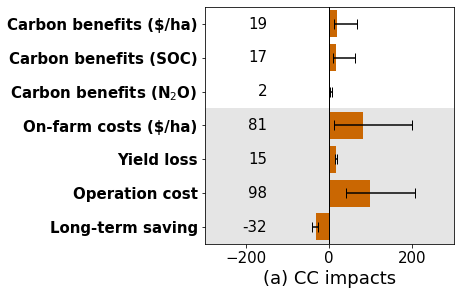

[ 64.4015526   52.43299485  11.96855775   8.95219143  36.95219143
 -57.          29.        ] [169.40408401 137.92157341  31.4825106  -57.37374303  -2.37374303
 -38.         -17.        ] [ 26.60064129  21.65710657   4.94353472 -38.8259133   -7.8259133
 -21.         -10.        ]


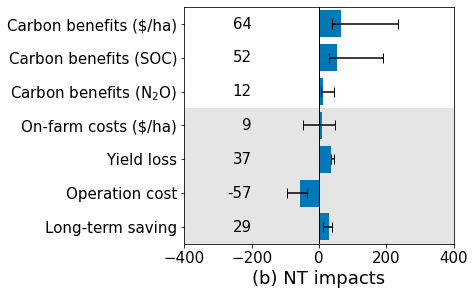

In [61]:
def plot_overall_costbenefit():
    items = ['CB', 'CB_SOC', 'CB_N2O', 'FC', 'YldReturn', 'Operation', 'Longterm']
    col_names = [head + item for head in ['CC_', 'NT_'] for item in items]
    cost_bef_bal = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017.csv', index_col=0)
    cost_bef_max = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017_max.csv', index_col=0)
    cost_bef_min = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017_min.csv', index_col=0)
    scale = 1000000
#     cost_bef_bal,cost_bef_bal_se,cost_bef_max,cost_bef_min = cost_bef_bal/scale,cost_bef_bal_se/scale, \
#                                                              cost_bef_max/scale,cost_bef_min/scale
    
    est_cty_cc_ghg = [cost_bef_bal[col] for col in col_names[:3]]
    est_cty_nt_ghg = [cost_bef_bal[col] for col in col_names[7:10]]
    est_cty_cc_mx_ghg = [(cost_bef_max[col]) for col in col_names[:3]]
    est_cty_nt_mx_ghg = [(cost_bef_max[col]) for col in col_names[7:10]]
    est_cty_cc_mn_ghg = [(cost_bef_min[col]) for col in col_names[:3]]
    est_cty_nt_mn_ghg = [(cost_bef_min[col]) for col in col_names[7:10]]

    est_cty_cc_cost = [-cost_bef_bal[col] for col in col_names[3:7]]
    est_cty_nt_cost = [-cost_bef_bal[col] for col in col_names[10:14]]
    est_cty_cc_mx_cost = [-cost_bef_max[col] for col in col_names[3:7]]
    est_cty_nt_mx_cost = [-cost_bef_max[col] for col in col_names[10:14]]
    est_cty_cc_mn_cost = [-cost_bef_min[col] for col in col_names[3:7]]
    est_cty_nt_mn_cost = [-cost_bef_min[col] for col in col_names[10:14]]


    est_cty_cc = est_cty_cc_ghg + est_cty_cc_cost
    est_cty_nt = est_cty_nt_ghg + est_cty_nt_cost
    est_cty_cc_mx = est_cty_cc_mx_ghg + est_cty_cc_mx_cost
    est_cty_nt_mx = est_cty_nt_mx_ghg + est_cty_nt_mx_cost
    est_cty_cc_mn = est_cty_cc_mn_ghg + est_cty_cc_mn_cost
    est_cty_nt_mn = est_cty_nt_mn_ghg + est_cty_nt_mn_cost

    colors = ['#c19831', '#559187', '#3a635c']
    colors = ['#0077B6', '#023E8A', '#CA6702', '#AE2012']
    colors = ['#0077B6', '#023E8A', '#CA6702', '#AE2012']

    fig_no = ['(a) CC impacts', '(b) NT impacts', '(c) NT impacts', '(d) NT impacts']
    titles = ['GHG', 'yield']
    # labels_cc = [r'GHG mitigation (10$^4$ t CO$_{2eq}$)', 'GHG mitigation (SOC)', r'GHG mitigation (N$_2$O)', 'On-farm costs ($ million)', 'Yield loss', 'Operation cost', 'Long-term saving']
    # labels_nt = [r'GHG mitigation (10$^5$ t CO$_{2eq}$)', 'GHG mitigation (SOC)', r'GHG mitigation (N$_2$O)', 'On-farm costs ($ million)', 'Yield loss', 'Operation cost', 'Long-term saving']
    labels_cc = [r'Carbon benefits ($/ha)', 'Carbon benefits (SOC)', r'Carbon benefits (N$_2$O)', 'On-farm costs ($/ha)', 'Yield loss', 'Operation cost', 'Long-term saving']
    labels_nt = [r'Carbon benefits ($/ha)', 'Carbon benefits (SOC)', r'Carbon benefits (N$_2$O)', 'On-farm costs ($/ha)', 'Yield loss', 'Operation cost', 'Long-term saving']
    cc_area = sum_county['corn_cc_area']
    nt_area = sum_county['corn_nt_area']

    for n, (grps, grps_mx, grps_mn) in enumerate(zip([est_cty_cc, est_cty_nt], [est_cty_cc_mx, est_cty_nt_mx], [est_cty_cc_mn, est_cty_nt_mn])):
        fig1, ax1 = plt.subplots(figsize=(7, 4.5))
        color_pal = []
        mean_ha, err_mx, err_mn = np.zeros(len(est_cty_cc)), np.zeros(len(est_cty_cc)), np.zeros(len(est_cty_cc))
        y_pos = range(7)
        for i, (grp, grp_mx, grp_mn) in enumerate(zip(grps, grps_mx, grps_mn)):

            if n < 1:
                mean_ha[i] = grp.sum() / cc_area.sum()
                err_mx[i] = (grp_mx.sum() / cc_area.sum()) - mean_ha[i]
                err_mn[i] = mean_ha[i] - (grp_mn.sum() / cc_area.sum())
                color_pal.append(colors[2])

            else:
                mean_ha[i] = grp.sum() / nt_area.sum()
                err_mx[i] = (grp_mx.sum() / nt_area.sum()) - mean_ha[i]
                err_mn[i] = mean_ha[i] - (grp_mn.sum() / nt_area.sum())
                color_pal.append(colors[0])

            
#         err_mx[:][3:] = -err_mx[:][3:]
#         err_mn[:][3:] = -err_mn[:][3:]
        print(mean_ha, err_mx, err_mn)

        # print(cc_area, nt_area)
        # print(mean_ha/cc_area, mean_ha/nt_area)
        ax1.barh(y_pos, mean_ha, xerr=[err_mn, err_mx], align='center', color=color_pal, capsize=5)
        ax1.axvline(x=0, c='k',linewidth=1)
        ax1.fill_between([-6000,6000], [2.5, 2.5], [6.5, 6.5], facecolor='gray', alpha=0.2)
        ax1.set_yticks(y_pos)
        labels = labels_cc if n == 0 else labels_nt
        if n == 0:
            ax1.set_yticklabels(labels = labels, fontweight = 'bold', size=15)
        else:
            ax1.set_yticklabels(labels=labels, size=15)
        ax1.tick_params(axis='x', labelsize=15)
        ax1.set_ylim(-0.5, 6.5)
        if n == 0:
            ax1.set_xlim(-300, 300)
            for i in y_pos:
                ax1.text(x=-150, y=i, s='{:.0f}'.format(mean_ha[i]), verticalalignment='center', horizontalalignment = 'right', size=15)
        else:
            ax1.set_xlim(-400, 400)
            for i in y_pos:
                ax1.text(x=-200, y=i, s='{:.0f}'.format(mean_ha[i]), verticalalignment='center', horizontalalignment = 'right', size=15)
        ax1.invert_yaxis()  # labels read top-to-bottom
        ax1.set_xlabel('{}'.format(fig_no[n]), size=18)
        # ax1.set_title('{}'.format(names[n]), fontweight="bold", size=15)
        fig1.tight_layout()
        plt.show()
        fig1.savefig(plot_dir + 'overall_costbenefit_{}.png'.format(titles[n]), dpi=300)
plot_overall_costbenefit()

ghg se [398.4343287358105, 9371.638487735416]
fc se [79781.43420830376, 59926.98514768035]
eff se [4.352985873559996, 0.13901096893500695]
FIPS
01    24.202299
05    31.125083
06    22.419882
08     9.479678
10    25.694052
13    24.127344
16    15.348424
17    26.939647
18    17.816812
19    21.645694
20    27.004612
21    27.736403
22    31.379757
24    21.701310
26     6.482423
27    17.864371
28    31.320497
29    30.335149
31     8.836416
36    16.690009
37    23.305541
38    14.083969
39    13.778384
40    26.099486
42    14.254861
45    24.947920
46    16.100545
47    25.560791
48    27.081533
51    20.561891
53     8.400663
55    22.057175
dtype: float64
FIPS
01    85.933884
05    69.264668
06    68.779792
08    56.071324
10    84.825226
13    95.522645
16    80.267782
17    64.095500
18    69.815512
19    63.582640
20    70.058505
21    66.541716
22    72.285986
24    74.465147
26    79.086540
27    61.467516
28    69.293447
29    64.869305
31    68.059718
36    59.709755
37  

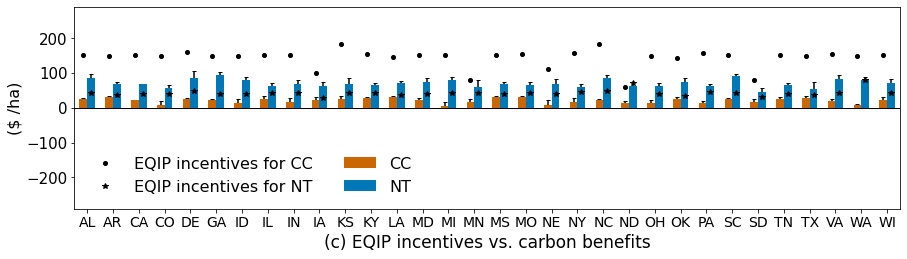

FIPS
01     55.850883
05     71.713895
06     79.397456
08     76.417707
10     59.921827
13     59.754985
16     71.274096
17     93.605641
18     86.537789
19    105.254030
20     90.781191
21     70.237174
22     78.661930
24     43.650263
26     59.941313
27     91.232266
28     64.689181
29     86.515687
31     86.947805
36     49.608643
37     55.924676
38     87.610592
39     77.350123
40     70.253953
42     54.441727
45     53.940944
46    103.002433
47     62.562188
48     66.879539
51     55.739099
53     16.336569
55     65.167707
dtype: float64
FIPS
01    -87.974869
05    -96.132772
06    -14.011280
08    -23.998071
10    -33.476216
13    -43.043282
16      8.844834
17     10.306420
18     10.124814
19     28.465297
20    -14.961499
21    -74.490356
22    -78.480094
24    -36.443500
26     35.372384
27     63.193611
28    -97.020319
29    -10.399671
31      3.454409
36     34.530109
37   -105.130552
38     93.150009
39     28.674168
40    -43.282459
42     18.581902
45    

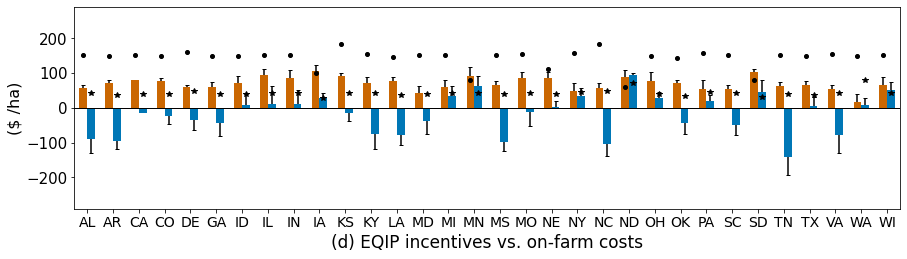

In [62]:
def plot_state_costbenefit():

    items = ['CB', 'FC'] # 'yld'
    # col_names = [head + item for head in ['CC_ha_cc_', 'CC_ha_cs_', 'NT_ha_cc_', 'NT_ha_cs_', 'CC_cty_', 'NT_cty_'] for item in items]
    col_names = [head + item for item in items for head in ['CC_', 'NT_']]
    sum_county = pd.read_csv(county_outputs_dir + 'county_aggregates_2017.csv')
    sum_county_se = pd.read_csv(county_outputs_dir + 'county_aggregates_2017.csv')
    cost_bef_bal = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017.csv', index_col=0)
    cost_bef_bal_se = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017.csv', index_col=0)
    cost_bef_max = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017_max.csv', index_col=0)
    cost_bef_min = pd.read_csv(county_outputs_dir + 'cost_bef_historic_2017_min.csv', index_col=0)
    cc_area = sum_county['corn_cc_area']
    nt_area = sum_county['corn_nt_area']

    # soilmap_ratio = cost_bef_bal['soilmap_ratio']
    est_cty_cb = [cost_bef_bal[col] for col in col_names[:2]]
    est_cty_fc = [-cost_bef_bal[col] for col in col_names[2:]]
    est_cty_cb_mx = [cost_bef_max[col] for col in col_names[:2]]
    est_cty_fc_mx = [-cost_bef_max[col] for col in col_names[2:]]
    est_cty_cb_mn = [cost_bef_min[col] for col in col_names[:2]]
    est_cty_fc_mn = [-cost_bef_min[col] for col in col_names[2:]]
    est_cty_cb_se = [cost_bef_bal[col] for col in col_names[:2]]
    est_cty_fc_se = [cost_bef_bal[col] for col in col_names[2:]]
    print('ghg se', [var.drop(0).mean()/46 for var in est_cty_cb])
    print('fc se', [var.drop(0).mean() for var in est_cty_fc])
    print('eff se', [(cost.drop(0).sum() / co2.drop(0).sum()) for (cost,co2) in zip(est_cty_fc, est_cty_cb)])
    eqip_data = pd.read_csv('D:/carbon credit/MVRcosts/EQIP_data.csv')
    eqip = eqip_data[~eqip_data['State'].isin(['MT', 'OR', 'VT'])].reset_index(drop=True)
    eqip_cc = eqip['2023 CC ha']
    eqip_nt = eqip['2023 NT ha']

    # colors = ['#cda236', '#977726', '#559187', '#3a635c'] # '#44746c', red'#c03730', blue'#3089c0'
    colors = ['#0077B6', '#023E8A', '#CA6702', '#AE2012']

    fig_no = ['(c) EQIP incentives vs. carbon benefits', '(d) EQIP incentives vs. on-farm costs']
    titles = ['GHG', 'On-farm costs']
    labels = ['CC', 'NT']

    for n, (grps, grps_mx, grps_mn, grps_se) in enumerate(zip([est_cty_cb, est_cty_fc], [est_cty_cb_mx, est_cty_fc_mx], [est_cty_cb_mn, est_cty_fc_mn], [est_cty_cb_se, est_cty_fc_se])):

        mean_ha, err_mx, err_mn, err_se = [0 for i in range(len(est_cty_cb))], [0 for i in range(len(est_cty_cb))], [0 for i in range(len(est_cty_cb))], [0 for i in range(len(est_cty_cb))]
        for i, (grp, grp_mx, grp_mn, grp_se) in enumerate(zip(grps, grps_mx, grps_mn, grps_se)):
            # grp = (grp * soilmap_ratio).groupby(pd.Series([i for i in range(3108) for n in range(5)])).sum().reset_index(drop=True)
            # grp_mx = (grp_mx * soilmap_ratio).groupby(pd.Series([i for i in range(3108) for n in range(5)])).sum().reset_index(drop=True)
            # grp_mn = (grp_mn * soilmap_ratio).groupby(pd.Series([i for i in range(3108) for n in range(5)])).sum().reset_index(drop=True)
            states = sum_county['FIPS'].astype(str).str.zfill(5).str[:2]
            if i == 0:
                grp_ha = (grp / cc_area)
                area_state = cc_area.groupby(states).sum()
                area_state = area_state[area_state != 0]
            else:
                grp_ha = (grp / nt_area)
                area_state = nt_area.groupby(states).sum()
                area_state = area_state[area_state != 0]
            # print(states)
            mean_ha[i] = grp_ha.replace(0, np.nan).dropna().groupby(states).mean()
            # mean_ha[i] = mean_ha[i][mean_ha[i] != 0] / area_state
            err_se[i] = grp_ha.replace(0, np.nan).dropna().groupby(states).std()
            err_se[i] = err_se[i][mean_ha[i] != 0]
            mean_ha[i] = mean_ha[i][mean_ha[i] != 0]
            # print(len(mean_ha[i]))
            err_mx[i] = grp_mx.groupby(states).sum()
            err_mx[i] = err_mx[i][err_mx[i] != 0] / area_state
            err_mx[i] = (err_mx[i] - mean_ha[i]).abs()
            err_mn[i] = grp_mn.groupby(states).sum()
            err_mn[i] = err_mn[i][err_mn[i] != 0] / area_state
            err_mn[i] = (err_mn[i] - mean_ha[i]).abs()
            # err_se[i] = grp_se.groupby(states).sum()
            # err_se[i] = (err_se[i][err_se[i] != 0] / area_state).abs()

            # print(len(mean_ha[0]), len(eqip_min), len(eqip_max))
            print(mean_ha[i])
        # print(mean_ha[0].index, mean_ha[0], err_mx[0], err_mn[0])
        fig1, ax1 = plt.subplots(figsize=(13, 4))
        color_pal1, color_pal2 = [], []
        states = ['AL','AR', 'CA', 'CO','DE','GA','ID','IL','IN','IA','KS','KY','LA','MD','MI','MN','MS','MO','NE','NY','NC','ND','OH','OK','PA','SC','SD','TN','TX','VA','WA','WI']
        for (mean_val1, mean_val2) in zip(mean_ha[0], mean_ha[1]):
            color_pal1.append(colors[2])
            color_pal2.append(colors[0])
        y_pos = np.arange(len(mean_ha[0]))
        # ax1.bar(y_pos-0.15, mean_ha[0], yerr=[err_mn[0], err_mx[0]], align='center', color=color_pal1, capsize=2, width = 0.3, label=labels[0])
        # ax1.bar(y_pos+0.15, mean_ha[1], yerr=[err_mn[1], err_mx[1]], align='center', color=color_pal2, capsize=2, width = 0.3, label=labels[1])
        err_cc_lw, err_cc_up, err_nt_lw, err_nt_up = [], [], [], []
        for i, (err1, err2) in enumerate(zip(mean_ha[0], mean_ha[1])):
            if err1 > 0:
                err_cc_lw.append(err1*0.5)
                err_cc_up.append(err_se[0][i])
            else:
                err_cc_lw.append(err_se[0][i])
                err_cc_up.append(-err1*0.5)
            if err2 > 0:
                err_nt_lw.append(err2*0.5)
                err_nt_up.append(err_se[1][i])
            else:
                err_nt_lw.append(err_se[1][i])
                err_nt_up.append(-err2*0.5)
        cc_bar = ax1.bar(y_pos-0.15, mean_ha[0], yerr = [err_cc_lw, err_cc_up], align='center', color=color_pal1, width = 0.3, label=labels[0], zorder=2, error_kw=dict(capsize = 2, zorder=1))
        nt_bar = ax1.bar(y_pos+0.15, mean_ha[1], yerr = [err_nt_lw, err_nt_up], align='center', color=color_pal2, width = 0.3, label=labels[1], zorder=2, error_kw=dict(capsize = 2, zorder=1))
        ax1.plot(y_pos[0]-0.15, eqip_cc.iloc[0], 'o', ms = 4, c = 'k', label='EQIP incentives for CC')
        ax1.plot(y_pos[1:]-0.15, eqip_cc.iloc[1:], 'o', ms = 4, c = 'k')
        ax1.plot(y_pos[0]+0.15, eqip_nt.iloc[0], '*', c = 'k', label='EQIP incentives for NT')
        ax1.plot(y_pos[1:]+0.15, eqip_nt.iloc[1:], '*', c = 'k')
        # ax1.plot(y_pos, - eqip_min, 'o', c='k')
        # ax1.plot(y_pos-0.15, mean_ha[0], 'k^', label=labels[0])
        # ax1.plot(y_pos+0.15, mean_ha[1], 'k*', label=labels[1])
        ax1.axhline(y=0, c='k',linewidth=1)
        # ax1.fill_between([-1500,1500], [-0.5, -0.5], [4.5, 4.5], facecolor='gray', alpha=0.2)
        ax1.set_xticks(y_pos)
        ax1.tick_params(axis='both', labelsize=15)
        ax1.set_xticklabels(labels = states, size=14)
        ax1.set_ylabel('($ /ha)', size=16)
        ax1.set_xlim(-0.5, 31.5)
        if n == 0:
            ax1.set_ylim(-290, 290)
        else:
            ax1.set_ylim(-290, 290)
        ax1.set_xlabel('{}'.format(fig_no[n]), size=17)
        if n == 0:
            ax1.legend(fontsize=16, framealpha=0, ncol = 2)
        # ax1.set_title('{}'.format(names[n]), fontweight="bold", size=15)
        fig1.tight_layout()
        plt.show()
        fig1.savefig(plot_dir + 'state_costbenefit_{}.png'.format(titles[n]), dpi=300)
plot_state_costbenefit()

[3.8326071699151916, 9.453904675089685, 3.5862810218206196, 8.630203657166659] [1.1438175240829018, 3.3400412373046837, 1.2598495009887358, 3.7183869119911943] [0.29844371556300464, 0.3532975370595217, 0.3512969266276733, 0.4308573771493083]
[350.9054697026594, 1033.2664195109894, 320.68005343902166, 932.9129659235448] [140.35197262848345, 406.9251658000612, 154.5896604622783, 453.01991896717595]
[6.960506196549863, 18.545395814401246, 6.960506196549871, 18.545395814401214] [734.7138913500543, 2140.904402513732, 734.7138913500546, 2140.9044025137346]
incentives for 30% adoption 734.7138913500543 80% adoption 2140.904402513732
GHG for 30% adoption 6.960506196549863 80% adoption 18.545395814401246


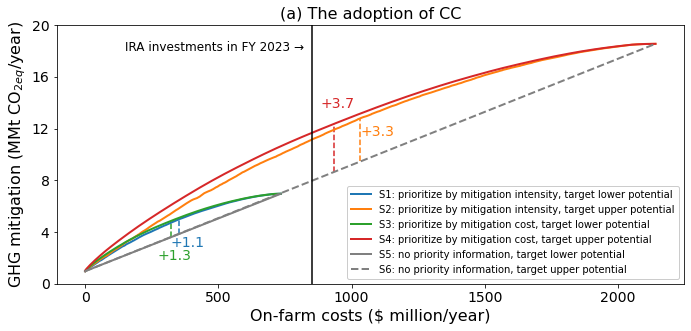

In [71]:
def plot_optimize_CC():
    data_pri = pd.read_csv(county_outputs_dir + 'CC_priority_outputs_cornfield.csv')
    current_response = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cornfield.csv', index_col=0)
    scale = 1000000
    cur_ghg = current_response['cc_cty_sum_ghg'].iloc[0] / scale
    int_30_ghg_cum = data_pri['int_30_ghg_cum'].dropna() / scale + cur_ghg
    int_30_fc_cum = - data_pri['int_30_fc_cum'].dropna() / scale
    int_50_ghg_cum = data_pri['int_50_ghg_cum'].dropna() / scale + cur_ghg
    int_50_fc_cum = - data_pri['int_50_fc_cum'].dropna() / scale
    eff_30_ghg_cum = data_pri['eff_30_ghg_cum'].dropna() / scale + cur_ghg
    eff_30_fc_cum = - data_pri['eff_30_fc_cum'].dropna() / scale
    eff_50_ghg_cum = data_pri['eff_50_ghg_cum'].dropna() / scale + cur_ghg
    eff_50_fc_cum = - data_pri['eff_50_fc_cum'].dropna() / scale
    slope1 = (int_30_ghg_cum.iloc[-1] - cur_ghg) / int_30_fc_cum.iloc[-1]
    slope2 = (int_50_ghg_cum.iloc[-1] - cur_ghg) / int_50_fc_cum.iloc[-1]

    int_30_diff = int_30_ghg_cum - (int_30_fc_cum * slope1 + cur_ghg)
    int_50_diff = int_50_ghg_cum - (int_50_fc_cum * slope2 + cur_ghg)
    eff_30_diff = eff_30_ghg_cum - (eff_30_fc_cum * slope1 + cur_ghg)
    eff_50_diff = eff_50_ghg_cum - (eff_50_fc_cum * slope2 + cur_ghg)
    int_30_rr = (int_30_ghg_cum / (int_30_fc_cum * slope1 + cur_ghg)) - 1
    int_50_rr = (int_50_ghg_cum / (int_50_fc_cum * slope2 + cur_ghg)) - 1
    eff_30_rr = (eff_30_ghg_cum / (eff_30_fc_cum * slope1 + cur_ghg)) - 1
    eff_50_rr = (eff_50_ghg_cum / (eff_50_fc_cum * slope2 + cur_ghg)) - 1
    int_30_fc_diff = (int_30_ghg_cum - cur_ghg) / slope1 - int_30_fc_cum
    int_50_fc_diff = (int_50_ghg_cum - cur_ghg) / slope2 - int_50_fc_cum
    eff_30_fc_diff = (eff_30_ghg_cum - cur_ghg) / slope1 - eff_30_fc_cum
    eff_50_fc_diff = (eff_50_ghg_cum - cur_ghg) / slope2 - eff_50_fc_cum

    idx_max = [int_30_diff.idxmax(), int_50_diff.idxmax(), eff_30_diff.idxmax(), eff_50_diff.idxmax()]
    idx_max_ghg = [int_30_ghg_cum.idxmax(), int_50_ghg_cum.idxmax(), eff_30_ghg_cum.idxmax(), eff_50_ghg_cum.idxmax()]
    idx_max_fc_diff = [int_30_fc_diff.idxmax(), int_50_fc_diff.idxmax(), eff_30_fc_diff.idxmax(), eff_50_fc_diff.idxmax()]
    peak_ghg = [int_30_ghg_cum[idx_max_ghg[0]], int_50_ghg_cum[idx_max_ghg[1]], eff_30_ghg_cum[idx_max_ghg[2]], eff_50_ghg_cum[idx_max_ghg[3]]]
    peak_ghg_fc = [int_30_fc_cum[idx_max_ghg[0]], int_50_fc_cum[idx_max_ghg[1]], eff_30_fc_cum[idx_max_ghg[2]], eff_50_fc_cum[idx_max_ghg[3]]]
    max_ghg = [int_30_ghg_cum[idx_max[0]], int_50_ghg_cum[idx_max[1]], eff_30_ghg_cum[idx_max[2]], eff_50_ghg_cum[idx_max[3]]]
    max_ghg_diff = [int_30_diff[idx_max[0]], int_50_diff[idx_max[1]], eff_30_diff[idx_max[2]], eff_50_diff[idx_max[3]]]
    max_fc_diff = [int_30_fc_diff.max(), int_50_fc_diff.max(), eff_30_fc_diff.max(), eff_50_fc_diff.max()]
    max_ghg_base = [max - diff for max, diff in zip(max_ghg, max_ghg_diff)]
    max_ghg_rr = [int_30_rr[idx_max[0]], int_50_rr[idx_max[1]], eff_30_rr[idx_max[2]], eff_50_rr[idx_max[3]]]
    max_fc = [int_30_fc_cum[idx_max[0]], int_50_fc_cum[idx_max[1]], eff_30_fc_cum[idx_max[2]], eff_50_fc_cum[idx_max[3]]]
    print(max_ghg_base, max_ghg_diff, max_ghg_rr)
    print(max_fc, max_fc_diff)
    print(peak_ghg, peak_ghg_fc)
    print('incentives for 30% adoption', int_30_fc_cum.iloc[-1], '80% adoption', int_50_fc_cum.iloc[-1])
    print('GHG for 30% adoption', int_30_ghg_cum.iloc[-1], '80% adoption', int_50_ghg_cum.iloc[-1])

    fig1, ax1 = plt.subplots(figsize=(10, 5))
    colors = ['#0077B6', '#023E8A', '#CA6702', '#AE2012']
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

    ax1.plot(int_30_fc_cum, int_30_ghg_cum, linewidth = 2, color = colors[0], label=r'S1: prioritize by mitigation intensity, target lower potential')
    ax1.plot(int_50_fc_cum, int_50_ghg_cum, linewidth = 2, color = colors[1], label=r'S2: prioritize by mitigation intensity, target upper potential')
    ax1.plot(eff_30_fc_cum, eff_30_ghg_cum, linewidth = 2, color = colors[2], label=r'S3: prioritize by mitigation cost, target lower potential')
    ax1.plot(eff_50_fc_cum, eff_50_ghg_cum, linewidth = 2, color = colors[3], label=r'S4: prioritize by mitigation cost, target upper potential')

    # the segments where GHG mitigation decreases as on-farm cost increases
    # ax1.plot(int_30_fc_cum[idx_max_ghg[0]:], int_30_ghg_cum[idx_max_ghg[0]:], '--', linewidth = 2, color = colors[0])
    # ax1.plot(int_50_fc_cum[idx_max_ghg[1]:], int_50_ghg_cum[idx_max_ghg[1]:], '--', linewidth = 2, color = colors[1])
    # ax1.plot(eff_30_fc_cum[idx_max_ghg[2]:], eff_30_ghg_cum[idx_max_ghg[2]:], '--', linewidth = 2, color = colors[2])
    # ax1.plot(eff_50_fc_cum[idx_max_ghg[3]:], eff_50_ghg_cum[idx_max_ghg[3]:], '--', linewidth = 2, color = colors[3])

    ax1.plot([0, int_30_fc_cum.iloc[-1]], [cur_ghg, int_30_ghg_cum.iloc[-1]], color = 'gray', linewidth = 2, label='S5: no priority information, target lower potential')
    ax1.plot([0, int_50_fc_cum.iloc[-1]], [cur_ghg, int_50_ghg_cum.iloc[-1]], '--', color = 'gray', linewidth = 2, label='S6: no priority information, target upper potential')
    ax1.set_ylabel(r'GHG mitigation (MMt CO$_{2eq}$/year)', size=16)
    ax1.set_xlabel('On-farm costs ($ million/year)', size=16)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.vlines(x=max_fc, ymin = max_ghg_base, ymax = max_ghg, colors=colors, linestyle = '--')
    # loc_y = [(a + b) / 2 for a, b in zip(max_ghg_base, max_ghg)]
    loc_y = max_ghg_base
    ax1.text(max_fc[0]-30, max_ghg_base[0]-1, '+{:.1f}'.format(max_ghg_diff[0]), color=colors[0], fontsize = 14)
    ax1.text(max_fc[1], max_ghg_base[1]+2, '+{:.1f}'.format(max_ghg_diff[1]), color=colors[1], fontsize = 14)
    ax1.text(max_fc[2]-50, max_ghg_base[2]-1.7, '+{:.1f}'.format(max_ghg_diff[2]), color=colors[2], fontsize = 14)
    ax1.text(max_fc[3]-50, max_ghg_base[3]+5, '+{:.1f}'.format(max_ghg_diff[3]), color=colors[3], fontsize = 14)
    ax1.set_title('(a) The adoption of CC', fontsize = 16)

    ax1.axvline(x=850, color = 'k', linestyle = '-')
    ax1.text(150, 18, 'IRA investments in FY 2023 →', fontsize = 12)

#     ax1.set_yticks(range(0,18,3))
    ax1.set_ylim([0,20])
    ax1.set_yticks(range(0, 24, 4))
    # ax2.plot(int_30_fc_cum, int_30_diff, linewidth = 2, color = colors[0], label=r'S1: prioritize by CO$_2$/ha, target adoption 30%')
    # ax2.plot(int_50_fc_cum, int_50_diff, '--', linewidth = 2, color = colors[1], label=r'S2: prioritize by CO$_2$/ha, target adoption 50%')
    # ax2.plot(eff_30_fc_cum, eff_30_diff, linewidth = 2, color = colors[2], label=r'S3: prioritize by $/t CO$_2$, target adoption 30%')
    # ax2.plot(eff_50_fc_cum, eff_50_diff, '--', linewidth = 2, color = colors[3], label=r'S4: prioritize by $/t CO$_2$, target adoption 50%')
    # ax2.set_ylabel(r'Difference in CO$_{2eq}$ mitigation', size=16)
    # ax2.set_xlabel('On-farm cost ($ million/year)', size=18)
    # ax2.tick_params(axis='both', labelsize=15)

    plt.legend(framealpha=1, fontsize = 10)
    plt.tight_layout()
    plt.show()
    fig1.savefig(plot_dir + 'CC_optimization_cornfields.png', dpi=500)
plot_optimize_CC()

[23.00754302104528, 23.00754302104528, 23.00754302104528, 23.00754302104528] [4.315172904391469, 13.953564953800965, 5.480735725332612, 16.676803722950556] [26.66874448714174, 63.00925951533891, 48.424636776755484, 131.22003721328198]
incentives for 31% adoption 37.3247983338744 52% adoption 53.92612977421684
GHG for 31% adoption 29.46254406036778 52% adoption 40.91545968699673


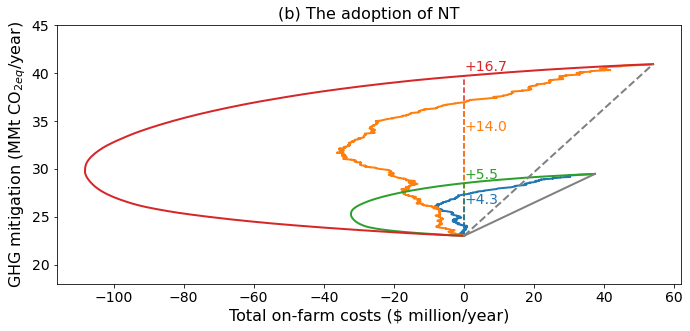

In [73]:
def plot_optimize_NT():
    data_pri = pd.read_csv(county_outputs_dir + 'NT_priority_outputs_cornfield.csv')
    current_response = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cornfield.csv', index_col=0)
    scale = 1000000
    cur_ghg = current_response['nt_cty_sum_ghg'].iloc[0] / scale
    int_30_ghg_cum = data_pri['int_30_ghg_cum'].dropna() / scale + cur_ghg
    int_30_fc_cum = - data_pri['int_30_fc_cum'].dropna() / scale
    int_50_ghg_cum = data_pri['int_50_ghg_cum'].dropna() / scale + cur_ghg
    int_50_fc_cum = - data_pri['int_50_fc_cum'].dropna() / scale
    eff_30_ghg_cum = data_pri['eff_30_ghg_cum'].dropna() / scale + cur_ghg
    eff_30_fc_cum = - data_pri['eff_30_fc_cum'].dropna() / scale
    eff_50_ghg_cum = data_pri['eff_50_ghg_cum'].dropna() / scale + cur_ghg
    eff_50_fc_cum = - data_pri['eff_50_fc_cum'].dropna() / scale
    slope1 = (int_30_ghg_cum.iloc[-1] - cur_ghg) / int_30_fc_cum.iloc[-1]
    slope2 = (int_50_ghg_cum.iloc[-1] - cur_ghg) / int_50_fc_cum.iloc[-1]

    
    
    int_30_diff = int_30_ghg_cum - (int_30_fc_cum * slope1 + cur_ghg)
    int_50_diff = int_50_ghg_cum - (int_50_fc_cum * slope2 + cur_ghg)
    eff_30_diff = eff_30_ghg_cum - (eff_30_fc_cum * slope1 + cur_ghg)
    eff_50_diff = eff_50_ghg_cum - (eff_50_fc_cum * slope2 + cur_ghg)
    int_30_rr = (int_30_ghg_cum / (int_30_fc_cum * slope1 + cur_ghg)) - 1
    int_50_rr = (int_50_ghg_cum / (int_50_fc_cum * slope2 + cur_ghg)) - 1
    eff_30_rr = (eff_30_ghg_cum / (eff_30_fc_cum * slope1 + cur_ghg)) - 1
    eff_50_rr = (eff_50_ghg_cum / (eff_50_fc_cum * slope2 + cur_ghg)) - 1
    int_30_fc_diff = (int_30_ghg_cum - cur_ghg) / slope1 - int_30_fc_cum
    int_50_fc_diff = (int_50_ghg_cum - cur_ghg) / slope2 - int_50_fc_cum
    eff_30_fc_diff = (eff_30_ghg_cum - cur_ghg) / slope1 - eff_30_fc_cum
    eff_50_fc_diff = (eff_50_ghg_cum - cur_ghg) / slope2 - eff_50_fc_cum


    int_30_fc_dis = (int_30_ghg_cum - cur_ghg) / slope1
    int_50_fc_dis = (int_50_ghg_cum - cur_ghg) / slope2
    eff_30_fc_dis = (eff_30_ghg_cum - cur_ghg) / slope1
    eff_50_fc_dis = (eff_50_ghg_cum - cur_ghg) / slope2
    int_30_fc_diff = int_30_fc_dis - int_30_fc_cum
    int_50_fc_diff = int_50_fc_dis - int_50_fc_cum
    eff_30_fc_diff = eff_30_fc_dis - eff_30_fc_cum
    eff_50_fc_diff = eff_50_fc_dis - eff_50_fc_cum

    int_30_ghg_diff = (int_30_ghg_cum[int_30_fc_cum<0].iloc[-1] - cur_ghg) - int_30_fc_cum[int_30_fc_cum<0].iloc[-1] * (int_30_ghg_cum[int_30_fc_cum>0].iloc[-1] - int_30_ghg_cum[int_30_fc_cum<0].iloc[-1])\
                      / (int_30_fc_cum[int_30_fc_cum>0].iloc[-1] - int_30_fc_cum[int_30_fc_cum<0].iloc[-1])
    int_50_ghg_diff = (int_50_ghg_cum[int_50_fc_cum<0].iloc[-1] - cur_ghg) - int_50_fc_cum[int_50_fc_cum<0].iloc[-1] * (int_50_ghg_cum[int_50_fc_cum>0].iloc[-1] - int_50_ghg_cum[int_50_fc_cum<0].iloc[-1])\
                      / (int_50_fc_cum[int_50_fc_cum>0].iloc[-1] - int_50_fc_cum[int_50_fc_cum<0].iloc[-1])
    eff_30_ghg_diff = (eff_30_ghg_cum[eff_30_fc_cum<0].iloc[-1] - cur_ghg) - eff_30_fc_cum[eff_30_fc_cum<0].iloc[-1] * (eff_30_ghg_cum[int_30_fc_cum>0].iloc[-1] - eff_30_ghg_cum[eff_30_fc_cum<0].iloc[-1])\
                      / (eff_30_fc_cum[eff_30_fc_cum>0].iloc[-1] - eff_30_fc_cum[eff_30_fc_cum<0].iloc[-1])
    eff_50_ghg_diff = (eff_50_ghg_cum[eff_50_fc_cum<0].iloc[-1] - cur_ghg) - eff_50_fc_cum[eff_50_fc_cum<0].iloc[-1] * (eff_50_ghg_cum[int_50_fc_cum>0].iloc[-1] - eff_50_ghg_cum[eff_50_fc_cum<0].iloc[-1])\
                      / (eff_50_fc_cum[eff_50_fc_cum>0].iloc[-1] - eff_50_fc_cum[eff_50_fc_cum<0].iloc[-1])

    idx_max = [int_30_diff.idxmax(), int_50_diff.idxmax(), eff_30_diff.idxmax(), eff_50_diff.idxmax()]
    max_ghg_diff = [int_30_ghg_diff, int_50_ghg_diff, eff_30_ghg_diff, eff_50_ghg_diff]
    max_fc_diff = [int_30_fc_diff.max(), int_50_fc_diff.max(), eff_30_fc_diff.max(), eff_50_fc_diff.max()]
    max_ghg = [max_ghg_diff[0] + cur_ghg, max_ghg_diff[1] + cur_ghg, max_ghg_diff[2] + cur_ghg, max_ghg_diff[3] + cur_ghg]
    max_fc = [0, 0, 0, 0]
    max_ghg_base = [cur_ghg, cur_ghg, cur_ghg, cur_ghg]
    
#     max_ghg_diff = [int_30_diff[idx_max[0]], int_50_diff[idx_max[1]], eff_30_ghg_diff, eff_50_ghg_diff]
#     max_fc_diff = [int_30_fc_diff.max(), int_50_fc_diff.max(), eff_30_fc_diff.max(), eff_50_fc_diff.max()]

    print(max_ghg_base, max_ghg_diff, max_fc_diff)
    print('incentives for 31% adoption', int_30_fc_cum.iloc[-1], '52% adoption', int_50_fc_cum.iloc[-1])
    print('GHG for 31% adoption', int_30_ghg_cum.iloc[-1], '52% adoption', int_50_ghg_cum.iloc[-1])

    fig1, ax1 = plt.subplots(figsize=(10, 5))
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
    ax1.plot(int_30_fc_cum, int_30_ghg_cum, linewidth = 2, color = colors[0], label=r'S1: prioritize by mitigation intensity, target low potential')
    ax1.plot(int_50_fc_cum, int_50_ghg_cum, linewidth = 2, color = colors[1], label=r'S2: prioritize by mitigation intensity, target high potential')
    ax1.plot(eff_30_fc_cum, eff_30_ghg_cum, linewidth = 2, color = colors[2], label=r'S3: prioritize by mitigation cost, target low potential')
    ax1.plot(eff_50_fc_cum, eff_50_ghg_cum, linewidth = 2, color = colors[3], label=r'S4: prioritize by mitigation cost, target high potential')
    ax1.plot([0, int_30_fc_cum.iloc[-1]], [cur_ghg, int_30_ghg_cum.iloc[-1]], color = 'gray', linewidth = 2, label='S5: no priority information, target low potential')
    ax1.plot([0, int_50_fc_cum.iloc[-1]], [cur_ghg, int_50_ghg_cum.iloc[-1]], '--', color = 'gray', linewidth = 2, label='S6: no priority information, target high potential')

    ax1.set_ylabel(r'GHG mitigation (MMt CO$_{2eq}$/year)', size=16)
    ax1.set_xlabel('Total on-farm costs ($ million/year)', size=16)
    ax1.tick_params(axis='both', labelsize=14)
    ax1.set_ylim([18,45])
    ax1.set_yticks(range(20,50,5))
    
#     y_max = [max_ghg_diff[i] + cur_ghg for i in [3,1,2,0]]
#     color_res = [colors[i] for i in [3, 1, 2, 0]]
    ymin = [max_ghg_base[3], max_ghg_base[1], max_ghg_base[2], max_ghg_base[0]]
    ymax = [max_ghg[3], max_ghg[1], max_ghg[2], max_ghg[0]]
    colors_re = [colors[3], colors[1], colors[2], colors[0]]
    ax1.vlines(x=max_fc, ymin = ymin, ymax = ymax, colors=colors_re, linestyle = '--')
    ax1.text(max_fc[0], max_ghg[0]-1, '+{:.1f}'.format(max_ghg_diff[0]), color=colors[0], fontsize = 14)
    ax1.text(max_fc[1], max_ghg[1]-3, '+{:.1f}'.format(max_ghg_diff[1]), color=colors[1], fontsize = 14)
    ax1.text(max_fc[2], max_ghg[2]+0.5, '+{:.1f}'.format(max_ghg_diff[2]), color=colors[2], fontsize = 14)
    ax1.text(max_fc[3], max_ghg[3]+0.5, '+{:.1f}'.format(max_ghg_diff[3]), color=colors[3], fontsize = 14)
    ax1.set_title('(b) The adoption of NT', fontsize = 16)


    # plt.legend(loc='upper left')
    plt.tight_layout()
    plt.show()
    fig1.savefig(plot_dir + 'NT_optimization_cornfields.png', dpi=500)
plot_optimize_NT()

GHG [23.008026536708623, 75.96630508900851, 75.96630508900851, 70.80662358799988, 18.40642122936692, 40.91545968699667, 40.91545968699667, 38.158730503163, 6.915669440446127, 29.46254406036777, 29.46254406036777, 27.56742930282388, 0.9728552332260751, 23.00754302104528]
se [14.272598319439034, 12.634064451549028, 12.634064451549028, 12.710880454752065, 11.418078655551225, 6.850733646984217, 6.850733646984217, 7.089989270694729, 4.283412487582872, 4.945938256199148, 4.945938256199148, 4.901400735814981, 0.5040919270937383, 3.6793475752715947]


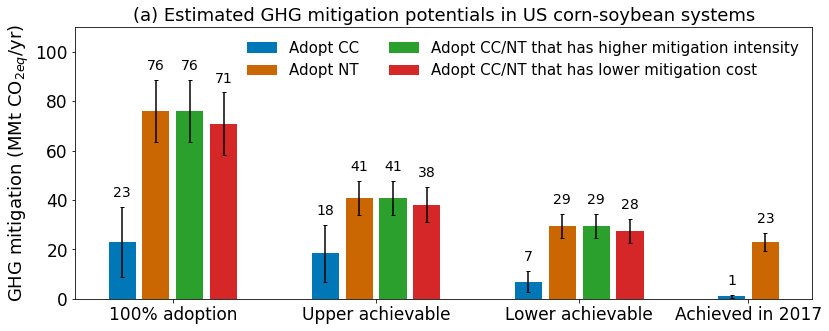

GHG [114.71103106871492, 380.2079977862446, 380.2079977862446, 364.55291840242813, 91.76882485497212, 202.91567058742706, 202.91567058742706, 194.6380069572372, 34.456369910388815, 140.87690975893403, 140.87690975893403, 135.30072766839228, 4.414422492920928, 96.6223993172879]
se [64.20249006297895, 56.69707787891218, 56.69707787891218, 56.95341877662742, 51.36199205038315, 30.64547074767227, 30.64547074767227, 31.368200726161227, 19.265345711960705, 22.034398639321395, 22.034398639321395, 21.94875636822777, 1.8490017068700844, 15.779552375077323]


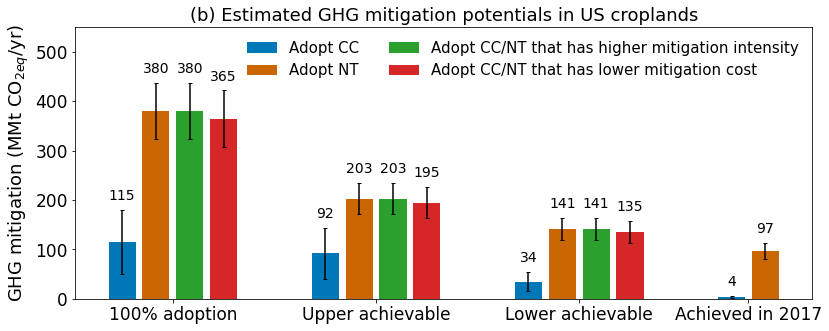

In [74]:
# plot GHG mitigation potentials in cornfields.
BMP_mitigation_cornfield = pd.read_csv(county_outputs_dir + 'Mitigation_potential_cornfield.csv', index_col=0)
BMP_mitigation_cornfield_se = pd.read_csv(county_outputs_dir + 'Mitigation_potential_cornfield_se.csv', index_col=0)
cur_mitigation_cornfield = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cornfield.csv', index_col=0)
cur_mitigation_cornfield_se = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cornfield_se.csv', index_col=0)
BMP_mitigation_cropland = pd.read_csv(county_outputs_dir + 'Mitigation_potential_cropland.csv', index_col=0)
BMP_mitigation_cropland_se = pd.read_csv(county_outputs_dir + 'Mitigation_potential_cropland_se.csv', index_col=0)
cur_mitigation_cropland = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cropland.csv', index_col=0)
cur_mitigation_cropland_se = pd.read_csv(county_outputs_dir + 'Mitigation_potential_current_cropland_se.csv', index_col=0)

def plot_adoption_BMP(BMP_response, BMP_response_se, current_response, current_response_se, title):
    
    new_row = {}
    for var in BMP_response.columns:
        new_row[var] = 0
    new_row = pd.DataFrame(new_row, index=[0])
    BMP_response = pd.concat([new_row, BMP_response]).reset_index(drop = True)
    # columns = ['cc_cty_sum', 'nt_cty_sum', 'soc_dom_sum', 'yld_dom_sum', 'sb_dom_sum', 'mrg_dom_sum']
    columns = ['cc_cty_sum', 'nt_cty_sum', 'int_dom_sum', 'eff_dom_sum']
    vars = ['_ghg', '_fc', '_ghg_se', '_fc_se']
    var = vars[0]
    scale = 1000000
    all_ghg = [BMP_response[col + vars[0]].iloc[-1]/scale for col in columns]
    all_ghg_lw = [BMP_response[col + vars[0]].iloc[2]/scale for col in columns]
    all_ghg_up = [BMP_response[col + vars[0]].iloc[3]/scale for col in columns]
    all_fc_lw = [-BMP_response[col + vars[1]].iloc[2]/scale for col in columns]
    all_fc_up = [-BMP_response[col + vars[1]].iloc[3]/scale for col in columns]

    cur_ghg = [current_response[col + vars[0]].iloc[-1]/scale for col in columns[:2]]
    cur_fc = [current_response[col + vars[1]].iloc[-1]/scale for col in columns[:2]]

    ghg_se = [BMP_response_se[col + vars[0]].iloc[-1]/scale for col in columns]
    ghg_lw_se = [BMP_response_se[col + vars[0]].iloc[1]/scale for col in columns]
    ghg_up_se = [BMP_response_se[col + vars[0]].iloc[2]/scale for col in columns]
    fc_lw_se = [-BMP_response_se[col + vars[1]].iloc[1]/scale for col in columns]
    fc_up_se = [-BMP_response_se[col + vars[1]].iloc[2]/scale for col in columns]

    cur_ghg_se = [current_response_se[col + vars[0]].iloc[-1]/scale for col in columns[:2]]
    cur_fc_se = [current_response_se[col + vars[1]].iloc[-1]/scale for col in columns[:2]]

    # [1, 31, 40, 52, 80, 100]
    gap_ghg = [i-j for (i, j) in zip(all_ghg_up, cur_ghg)]
    gap_fc = [i - j for (i, j) in zip(all_fc_up, cur_fc)]
    print('GHG', all_ghg+all_ghg_up+all_ghg_lw+ cur_ghg)
    print('se', ghg_se+ghg_up_se+ghg_lw_se+cur_ghg_se)
    y_labels = [r'GHG mitigation (MMt CO$_{2eq}$/yr)', 'On-farm costs ($ million/yr)']
    x_labels = ['100% adoption', 'Upper achievable', 'Lower achievable', 'Achieved in 2017']
    titles = ['(e) GHG emissions response to adoption', '(b) Yield response to adoption', '(f) On-farm costs response to adoption', r'(c) Margin$_{out}$ response to adoption', r'(d) Margin$_{in+out}$ response to adoption']
    legends = ['Adopt CC', 'Adopt NT', 'Adopt CC/NT that has higher mitigation intensity', 'Adopt CC/NT that has lower mitigation cost']
    names = ['GHG', 'On-farm costs']
    fig1, ax1 = plt.subplots(figsize=(12, 5))
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
    colors = ['#0077B6', '#CA6702', 'tab:green', 'tab:red']
    bp0 = ax1.bar(range(1,5), all_ghg, yerr = ghg_se, align='center', color=colors, zorder=1, error_kw=dict(capsize = 2, zorder=2)) # capsize=2, width=0.3,
    bp1 = ax1.bar(range(7,11), all_ghg_up, yerr = ghg_up_se, align='center', color=colors, zorder=1, error_kw=dict(capsize = 2, zorder=2)) # capsize=2, width=0.3,
    bp2 = ax1.bar(range(13,17), all_ghg_lw, yerr = ghg_lw_se, align='center', color=colors, zorder=1, error_kw=dict(capsize = 2, zorder=2)) # capsize=2, width=0.3,
    bp3 = ax1.bar(range(19,21), cur_ghg, yerr = cur_ghg_se, align='center', color=colors, zorder=1, error_kw=dict(capsize = 2, zorder=2)) # capsize=2, width=0.3,

    ymax = np.max(all_ghg) * 1.5
    ax1.set_ylim([0.01,ymax])
    for (bars, err) in zip([bp0, bp1, bp2, bp3], [ghg_se, ghg_up_se, ghg_lw_se, cur_ghg_se]):
        # Using Matplotlib's annotate function and
        # passing the coordinates where the annotation shall be done
        # x-coordinate: bar.get_x() + bar.get_width() / 2
        # y-coordinate: bar.get_height()
        # free space to be left to make graph pleasing: (0, 8)
        # ha and va stand for the horizontal and vertical alignment
        
        for i, patch in enumerate(bars.patches):
            ax1.text(patch.get_x() + patch.get_width()/2, patch.get_height()+err[i]+ymax*0.05,
                     str(round(patch.get_height())), ha='center', va='center',
                     fontsize=14,
                     color='k')

    ax1.set_ylabel('{}'.format(y_labels[0]), size=18)
    # ax1.set_xlabel('Adoption rate (%)', size=19)
    ax1.tick_params(axis='both', labelsize=17)
    ax1.set_xticks([2.5, 8.5, 14.5, 19.5])
    ax1.set_xticklabels(x_labels, fontsize = 17)
    
    if title == 'cornfield':
        ax1.set_title('(a) Estimated GHG mitigation potentials in US corn-soybean systems', fontsize = 18)
        ax1.set_ylim([0,110])
    else:
        ax1.set_title('(b) Estimated GHG mitigation potentials in US croplands', fontsize = 18)
        ax1.set_ylim([0,550])
    plt.legend(bp1, legends, framealpha=0, fontsize = 15, ncol = 2, loc='upper right')
    fig1.tight_layout()
    plt.show()
    fig1.savefig(plot_dir + '{}_potential_{}.png'.format(title, names[0]), dpi=300)
plot_adoption_BMP(BMP_mitigation_cornfield, BMP_mitigation_cornfield_se, cur_mitigation_cornfield, 
                  cur_mitigation_cornfield_se, 'cornfield')
plot_adoption_BMP(BMP_mitigation_cropland, BMP_mitigation_cropland_se, cur_mitigation_cropland, 
                  cur_mitigation_cropland_se, 'croplands')